# Summarize models

This notebook summarizes all metrics required for model comparison including the following:

  1. Standardized predictor distributions
  1. Model residuals by predictor
  1. Forecast errors overall and by timepoint
  1. Model coefficients averages and by timepoint
  
## Table of contents

 1. [Import and define functions](#Import-and-define-functions)
 1. [Define configuration settings](#Define-configuration-settings)
 1. [Load data](#Load-data)
 1. [Summarize predictors](#Summarize-predictors)
 1. [Summarize model residuals](#Summarize-model-residuals)
 1. [Summarize observed and predicted distances](#Summarize-observed-and-predicted-distances)
 1. [Summarize model forecasting error](#Summarize-model-forecasting-error)

## Import and define functions
[back to top](#Summarize-models)

In [1]:
import Bio.SeqIO
from collections import defaultdict
import glob
import json
import matplotlib as mpl
import matplotlib.dates as mdates
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import networkx as nx
import numpy as np
import pandas as pd
from scipy.stats import pearsonr
from scipy.stats import linregress
import seaborn as sns

%matplotlib inline

In [2]:
sns.set_style("white")
plt.style.use("huddlej")

In [3]:
mpl.rcParams['savefig.dpi'] = 200
mpl.rcParams['figure.dpi'] = 200
mpl.rcParams['font.weight'] = 300
mpl.rcParams['axes.labelweight'] = 300
mpl.rcParams['font.size'] = 18

In [4]:
!pwd

/Users/jlhudd/projects/nextstrain/flu-forecasting/analyses


In [5]:
def mean_absolute_error(observed, estimated, **kwargs):
    """
    Calculates the mean absolute error between observed and estimated values.

    Parameters
    ----------
    observed : numpy.ndarray
        observed values

    estimated : numpy.ndarray
        estimated values

    Returns
    -------
    float :
        mean absolute error between observed and estimated values
    """
    return np.mean(np.abs(observed - estimated))

def root_mean_square_error(observed, estimated, **kwargs):
    """
    Calculates the root mean square error between observed and estimated values.

    Parameters
    ----------
    observed : numpy.ndarray
        observed values

    estimated : numpy.ndarray
        estimated values

    Returns
    -------
    float :
        root mean square error between observed and estimated values
    """
    return np.sqrt(np.mean((observed - estimated) ** 2))

def mean_square_error(observed, estimated, **kwargs):
    """
    Calculates the mean square error between observed and estimated values.

    Parameters
    ----------
    observed : numpy.ndarray
        observed values

    estimated : numpy.ndarray
        estimated values

    Returns
    -------
    float :
        mean square error between observed and estimated values
    """
    return np.mean((observed - estimated) ** 2)

def facet_time_plot(data, value, value_label, timepoint_column="timepoint", predictors_column="predictors", hue=None,
                    height=4, aspect=1, col_order=None, col_wrap=4, markersize=15, grid_kwargs=None):
    if grid_kwargs is None:
        grid_kwargs = {}
        
    g = sns.FacetGrid(data, col=predictors_column, col_order=col_order, col_wrap=col_wrap, hue=hue, height=height, aspect=aspect, **grid_kwargs)
    g.map_dataframe(sns.lineplot, x=timepoint_column, y=value, estimator="mean", ci="sd", markers=True, dashes=False,
                   style=predictors_column, markersize=markersize)
    g.set_axis_labels("Date", value_label)

    for ax in g.axes.flatten():
        ax.axhline(y=0, color="#cccccc", zorder=-10)

        #start, end = [int(value) for value in ax.get_xlim()]
        #end = end + 1
        #stepsize = 2.0
        #ax.xaxis.set_ticks(np.arange(start, end, stepsize))

        #labels = ax.get_xticklabels()
        #output = plt.setp(labels, rotation=30)
        
    plt.gcf().autofmt_xdate()
    return g

## Define configuration settings
[back to top](#Summarize-models)

In [6]:
predictor_names_order = [
    "naive",
    "delta_frequency",
    "lbi",
    "ep",
    "ep_star",
    "ep_x",
    "ep_luksza_x",
    "cTiterSub",
    "cTiterSub_star",
    "cTiterSub_x",
    "ne_star",
    "dms",
    "dms_star",
    "lbi-cTiterSub_x",
    "lbi-delta_frequency",
    "lbi-dms_star-cTiterSub_x",
    "lbi-ep_x-ne_star"
]

In [7]:
predictor_names_order = [
    "naive",
    "ep_x",
    "cTiterSub_x",
    "ne_star",
    "dms_star",
    "lbi",
    "delta_frequency"
]

#predictor_names_order = [
#    "naive",
#    "lbi"
#]

In [8]:
best_models = [
    "ep_x",
    "ne_star",
    "lbi",
    "lbi-ep_x-ne_star",
    "cTiterSub_x",
    "dms_star",
    "delta_frequency",
    "lbi-cTiterSub_x-dms_star"
]

best_predictor_names = [
    "epitope mutations",
    "non-epitope mutations",
    "LBI",
    "LBI and mutations",
    "HI phenotypes",
    "DMS phenotypes",
    "delta frequency",
    "LBI, HI, and DMS"
]

In [9]:
data_root = "../results/builds/h3n2/90_viruses_per_month/sample_0/2000-10-01--2015-10-01/"
data_root = "../results/builds/h3n2/1_viruses_per_month/sample_0/2000-10-01--2015-10-01/"
data_root = "../results/builds/h3n2/5_viruses_per_month/sample_0/1994-10-01--2015-10-01/"

data_root = "../results/builds/h3n2/10_viruses_per_month/sample_0/1994-10-01--2015-10-01/"

#data_root = "../results/builds/h3n2/30_viruses_per_month/sample_0/1994-10-01--2015-10-01/"

## Load data
[back to top](#Summarize-models)

In [10]:
tip_attributes_df = pd.read_table(data_root + "tip_attributes_with_weighted_distances.tsv", parse_dates=["timepoint"])

In [11]:
observed_weighted_distances = tip_attributes_df.loc[:, ["timepoint", "strain", "frequency", "weighted_distance_to_future"]].copy()

In [12]:
observed_weighted_distances["y"] = observed_weighted_distances["weighted_distance_to_future"]

In [13]:
model_jsons = glob.glob(data_root + "models_by_distances/*.json")

In [14]:
models_by_predictors = {}

for model_json in model_jsons:
    with open(model_json, "r") as fh:
        data = json.load(fh)
        models_by_predictors["-".join(data["predictors"])] = data

In [15]:
models_by_predictors["lbi"]["cost_function"]

'diffsum'

In [16]:
models_by_predictors["lbi"]["l1_lambda"]

0.0

In [17]:
models_by_predictors["lbi"]["training_window"]

6

In [18]:
models_by_predictors["lbi"]["pseudocount"]

In [19]:
type(models_by_predictors["lbi"])

dict

In [20]:
sorted(models_by_predictors.keys())

['cTiterSub',
 'cTiterSub_x',
 'delta_frequency',
 'dms_star',
 'ep',
 'ep_x',
 'lbi',
 'lbi-cTiterSub_x-dms_star',
 'lbi-ep_x-ne_star',
 'naive',
 'ne_star']

In [21]:
models_by_predictors["lbi"].keys()

dict_keys(['scores', 'predictors', 'cv_error_mean', 'cv_error_std', 'coefficients_mean', 'coefficients_std', 'mean_stds_mean', 'mean_stds_std', 'cost_function', 'l1_lambda', 'delta_months', 'training_window', 'pseudocount'])

In [22]:
models_by_predictors["lbi"]["scores"][0].keys()

dict_keys(['predictors', 'training_data', 'training_n', 'training_error', 'coefficients', 'mean_stds', 'validation_data', 'validation_n', 'validation_error', 'last_training_timepoint', 'validation_timepoint'])

In [23]:
models_by_predictors["lbi"]["scores"][0]["training_n"]

447

In [24]:
models_by_predictors["lbi"]["scores"][0]["validation_data"].keys()

dict_keys(['X', 'y', 'y_hat'])

In [25]:
models_by_predictors["lbi"]["scores"][0]["coefficients"]

[0.6618740182356625]

In [26]:
models_by_predictors["lbi"]["scores"][0]["mean_stds"]

[0.1704521335794737]

In [27]:
len(models_by_predictors["lbi"]["scores"])

25

Build data frames for plotting from the model scores.

In [28]:
overall_errors = []
errors_by_time = []
overall_coefficients = []
coefficients_by_time = []
mean_stds_by_time = []
frequency_dfs = []
residuals_dfs = []

for predictors, model in models_by_predictors.items():
    overall_errors.append({
        "predictors": predictors,
        "cv_error_mean": model["cv_error_mean"],
        "cv_error_std": model["cv_error_std"]
    })

    for predictor, mean, std in zip(model["predictors"], model["coefficients_mean"], model["coefficients_std"]):
        overall_coefficients.append({
            "predictors": predictors,
            "predictor": predictor,
            "mean": mean,
            "std": std
        })
    
    for scores in model["scores"]:
        errors_by_time.append({
            "predictors": predictors,
            "validation_timepoint": scores["validation_timepoint"],
            "validation_error": scores["validation_error"],
            "validation_n": scores["validation_n"]
        })
        
        for predictor, coefficient, mean_std in zip(model["predictors"], scores["coefficients"], scores["mean_stds"]):
            coefficients_by_time.append({
                "predictors": predictors,
                "predictor": predictor,
                "coefficient": coefficient,
                "validation_timepoint": scores["validation_timepoint"]
            })
            
            mean_stds_by_time.append({
                "predictors": predictors,
                "predictor": predictor,
                "mean_std": mean_std,
                "validation_timepoint": scores["validation_timepoint"]
            })
        
        X = pd.DataFrame(scores["validation_data"]["X"])
        X["timepoint"] = pd.to_datetime(X["timepoint"])

        y = pd.DataFrame(scores["validation_data"]["y"])
        y["timepoint"] = pd.to_datetime(y["timepoint"])
        y["future_timepoint"] = pd.to_datetime(y["future_timepoint"])

        y_hat = pd.DataFrame(scores["validation_data"]["y_hat"])
        y_hat["timepoint"] = pd.to_datetime(y_hat["timepoint"])

        frequency_df = y_hat.merge(
            observed_weighted_distances,
            on=["timepoint", "strain", "frequency"],
            suffixes=["_hat", ""]
        )
        frequency_df["residual"] = frequency_df["y"] - frequency_df["y_hat"]
        frequency_df["validation_timepoint"] = pd.to_datetime(scores["validation_timepoint"])
        frequency_df["predictors"] = predictors
        frequency_dfs.append(frequency_df)

        training_X = pd.DataFrame(scores["training_data"]["X"])
        training_X["timepoint"] = pd.to_datetime(training_X["timepoint"])

        training_y = pd.DataFrame(scores["training_data"]["y"])
        training_y["timepoint"] = pd.to_datetime(training_y["timepoint"])
        training_y_hat = pd.DataFrame(scores["training_data"]["y_hat"])
        training_y_hat["timepoint"] = pd.to_datetime(training_y_hat["timepoint"])
        residual_df = training_y_hat.merge(
            observed_weighted_distances,
            on=["timepoint", "strain", "frequency"],
            suffixes=["_hat", ""]
        )
        residual_df["residual"] = residual_df["y"] - residual_df["y_hat"]
        residual_df["validation_timepoint"] = pd.to_datetime(scores["validation_timepoint"])
        residual_df["predictors"] = predictors

        residuals_dfs.append(residual_df)
        
overall_errors_df = pd.DataFrame(overall_errors)
errors_by_time_df = pd.DataFrame(errors_by_time)
overall_coefficients_df = pd.DataFrame(overall_coefficients)
coefficients_by_time_df = pd.DataFrame(coefficients_by_time)
mean_stds_by_time_df = pd.DataFrame(mean_stds_by_time)
frequency_df = pd.concat(frequency_dfs, ignore_index=True)
residual_df = pd.concat(residuals_dfs, ignore_index=True)

In [29]:
frequency_df.head()

,frequency,projected_frequency,strain,timepoint,weighted_distance_to_future_hat,weighted_distance_to_present,y_hat,weighted_distance_to_future,y,residual,validation_timepoint,predictors
0,0.015263,0.012075,A/Argentina/1/2002,2002-10-01,18.275491,12.719145,13.394808,18.275491,18.275491,4.880683,2002-10-01,dms_star
1,0.002922,0.002408,A/Auckland/615/2002,2002-10-01,19.025516,9.925928,11.810088,19.025516,19.025516,7.215428,2002-10-01,dms_star
2,0.005491,0.003853,A/Bangkok/103/2002,2002-10-01,18.233858,9.193566,11.051976,18.233858,18.233858,7.181882,2002-10-01,dms_star
3,0.006722,0.001784,A/Bangkok/109/2002,2002-10-01,21.078948,11.705114,13.782334,21.078948,21.078948,7.296614,2002-10-01,dms_star
4,0.016552,0.036848,A/Bangkok/190/2002,2002-10-01,8.721310,10.102699,8.354648,8.721310,8.721310,0.366662,2002-10-01,dms_star


In [30]:
residual_df.head()

,frequency,projected_frequency,strain,timepoint,weighted_distance_to_future_hat,weighted_distance_to_present,y_hat,weighted_distance_to_future,y,residual,validation_timepoint,predictors
0,0.005754,0.004068,A/England/255/1995,1995-10-01,11.402288,8.093992,8.939354,11.402288,11.402288,2.462934,2002-10-01,dms_star
1,0.044366,0.040098,A/England/258/1995,1995-10-01,19.675134,12.219141,10.110084,19.675134,19.675134,9.565050,2002-10-01,dms_star
2,0.052884,0.051654,A/England/263/1995,1995-10-01,19.697699,10.018819,8.153289,19.697699,19.697699,11.544410,2002-10-01,dms_star
3,0.069809,0.113333,A/England/268/1995,1995-10-01,19.697699,9.656707,7.765778,19.697699,19.697699,11.931921,2002-10-01,dms_star
4,0.081190,0.041842,A/England/282/1995,1995-10-01,21.429643,11.694057,9.985921,21.429643,21.429643,11.443722,2002-10-01,dms_star


In [31]:
residual_df.shape

(491711, 12)

In [32]:
overall_errors_df.sort_values("cv_error_mean")

,cv_error_mean,cv_error_std,predictors
2,5.392575,1.827850,lbi
3,5.449006,1.943144,lbi-ep_x-ne_star
5,6.034003,1.937131,delta_frequency
9,6.362874,3.786670,lbi-cTiterSub_x-dms_star
0,6.369727,1.480285,dms_star
4,6.487428,1.708466,ne_star
8,6.609278,1.594481,naive
1,6.615278,1.250023,ep
7,6.745438,1.555723,ep_x
10,6.855544,2.599366,cTiterSub


## Summarize predictors
[back to top](#Summarize-models)

In [33]:
individual_predictor_names_order = [
    predictor
    for predictor in predictor_names_order
    if not "-" in predictor and predictor != "naive"
]

In [34]:
long_predictors_df = tip_attributes_df.melt(
    id_vars=["strain", "timepoint"],
    value_vars=individual_predictor_names_order,
    var_name="predictor",
    value_name="predictor_value"
)

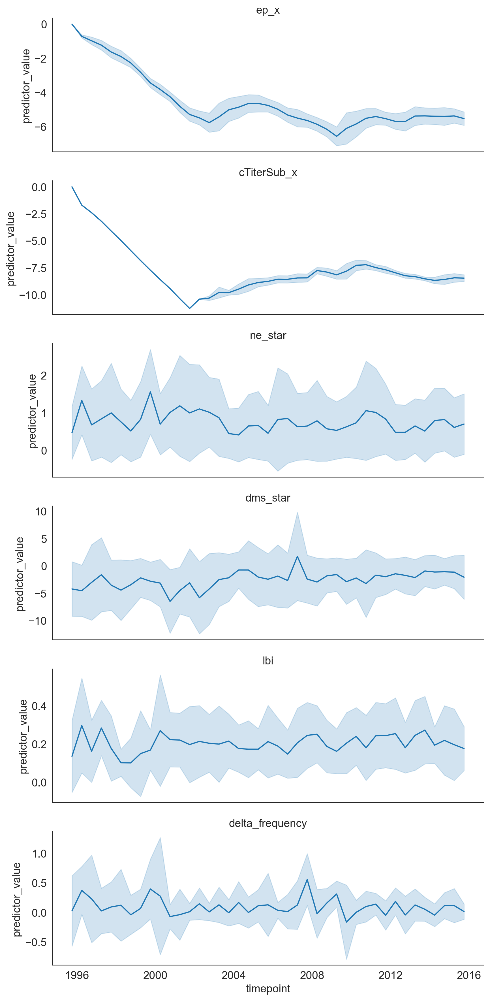

In [35]:
g = sns.FacetGrid(long_predictors_df, row="predictor", aspect=3, sharey=False,
                  row_order=individual_predictor_names_order)
g.map(sns.lineplot, "timepoint", "predictor_value", ci="sd")
g.set_titles("{row_name}")

plt.savefig("../manuscript/figures/predictors_by_timepoint.pdf")

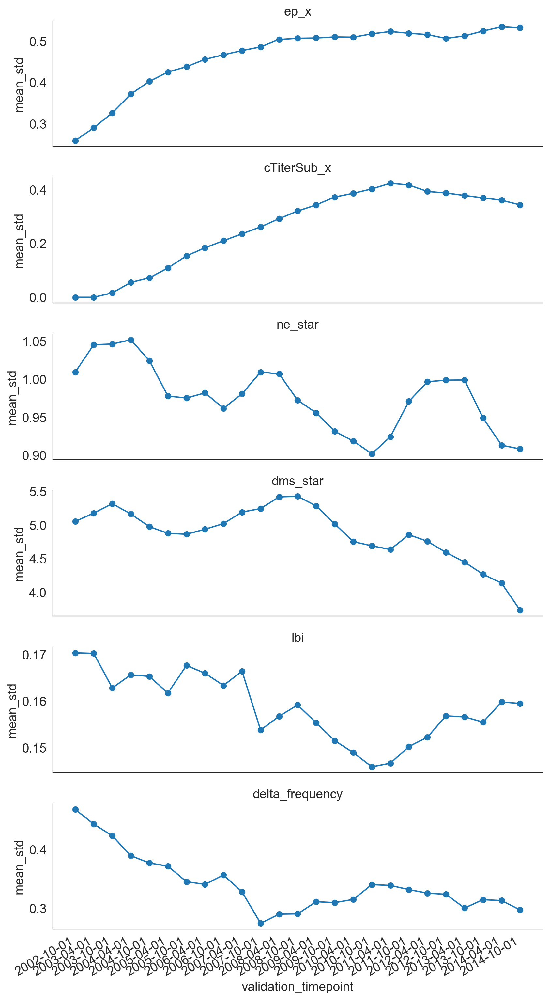

In [36]:
g = sns.FacetGrid(
    mean_stds_by_time_df[mean_stds_by_time_df["predictors"].isin(individual_predictor_names_order)],
    row="predictor",
    row_order=individual_predictor_names_order,
    aspect=3,
    sharey=False
)
g.map(plt.plot, "validation_timepoint", "mean_std", marker="o")
g.set_titles("{row_name}")

plt.gcf().autofmt_xdate()

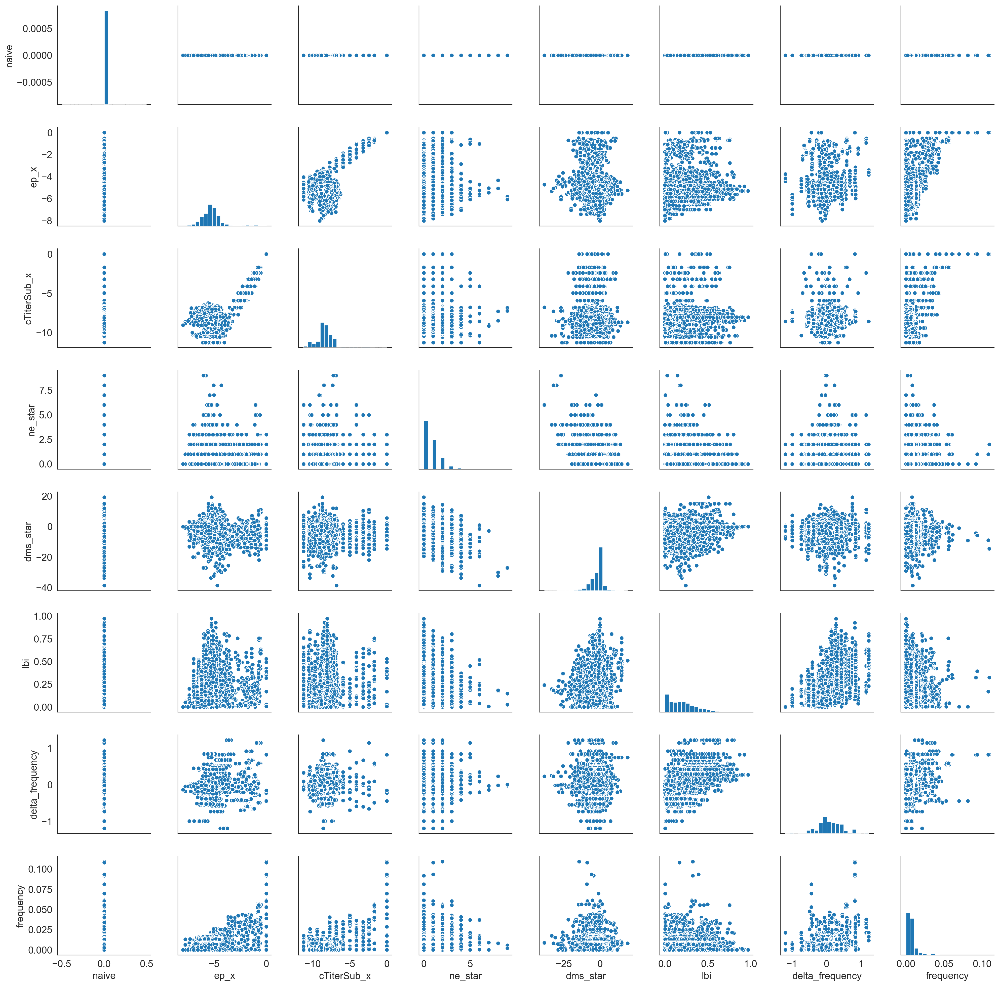

In [37]:
variables_to_plot = [predictor for predictor in predictor_names_order if not "-" in predictor] + ["frequency"]
sns.pairplot(tip_attributes_df.dropna(), vars=variables_to_plot, diag_kind="hist", diag_kws={"bins": 20})

In [38]:
tip_attributes_df.loc[pd.isnull(tip_attributes_df["ep_x"]), ["strain", "timepoint", "frequency"]]

,strain,timepoint,frequency


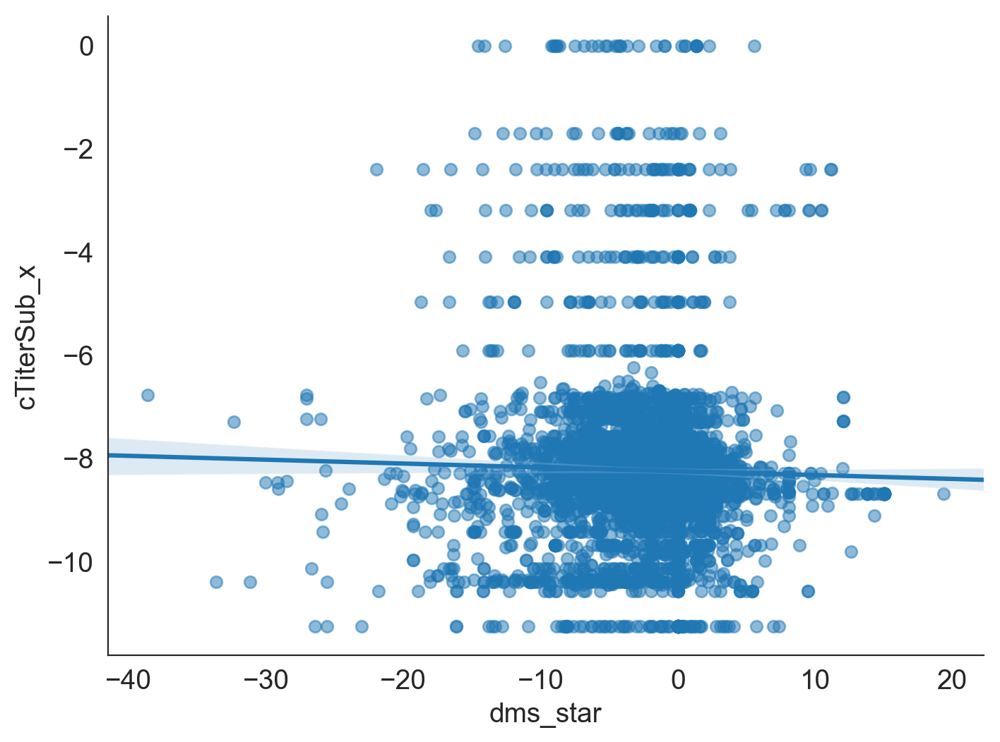

In [39]:
fig, ax = plt.subplots(1, 1, figsize=(8, 6))
sns.regplot("dms_star", "cTiterSub_x", tip_attributes_df, scatter_kws={"alpha": 0.5}, ax=ax)

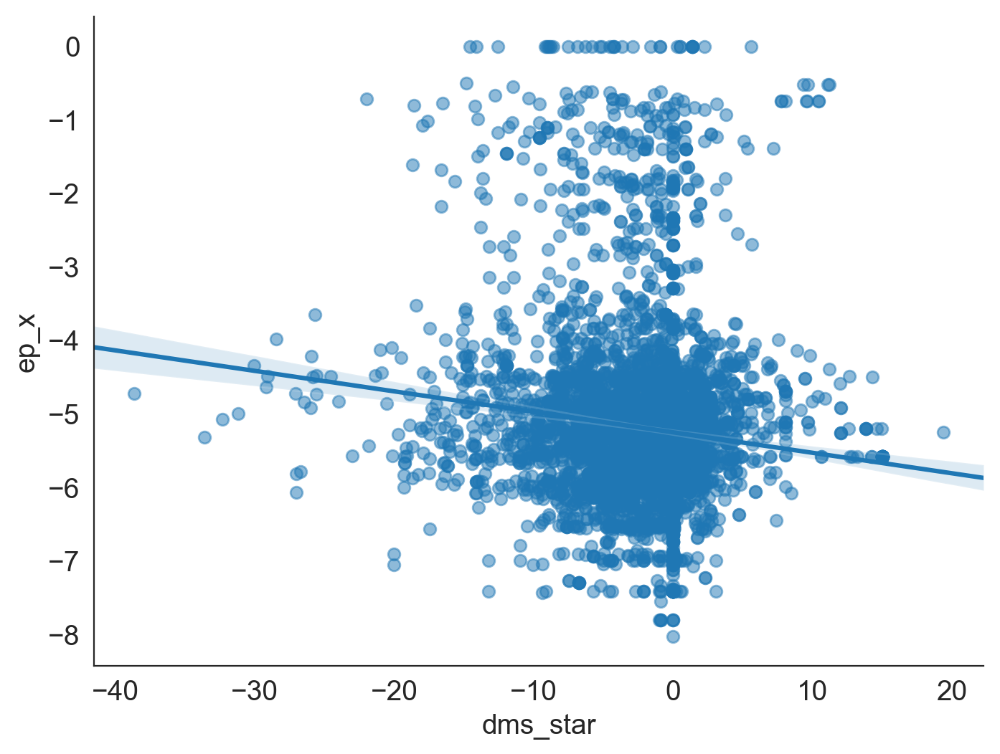

In [40]:
fig, ax = plt.subplots(1, 1, figsize=(8, 6))
sns.regplot("dms_star", "ep_x", tip_attributes_df, scatter_kws={"alpha": 0.5}, ax=ax)

In [41]:
tip_attributes_df.loc[tip_attributes_df["dms_star"] < -15, ["timepoint", "strain", "cTiterSub_x", "ep_x", "dms_star", "frequency", "raw_date"]].head()

,timepoint,strain,cTiterSub_x,ep_x,dms_star,frequency,raw_date
60,1996-10-01,A/Fujian/202/1996,-2.392848,-0.775287,-16.53,0.037806,1996-07-02
61,1996-10-01,A/Guangxi/126/1996,-2.392848,-0.799925,-18.58,0.000603,1996-01-26
96,1996-10-01,A/Shanghai/15/1996,-2.392848,-0.710663,-21.97,0.037379,1996-07-25
106,1997-04-01,A/Beijing/259/1996,-3.183673,-1.020165,-17.63,0.034551,1996-12-23
150,1997-04-01,A/Shanghai/15/1996,-3.183673,-1.079486,-17.99,0.000482,1996-07-25


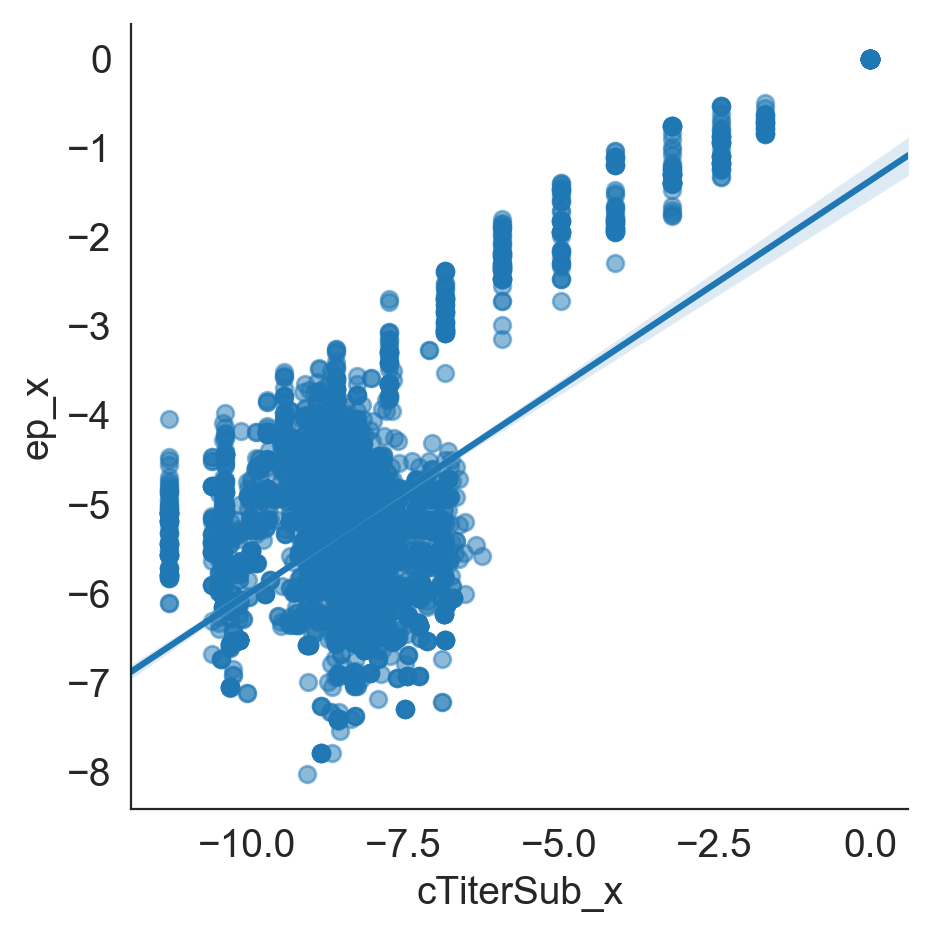

In [42]:
sns.lmplot("cTiterSub_x", "ep_x", tip_attributes_df, scatter_kws={"alpha": 0.5})

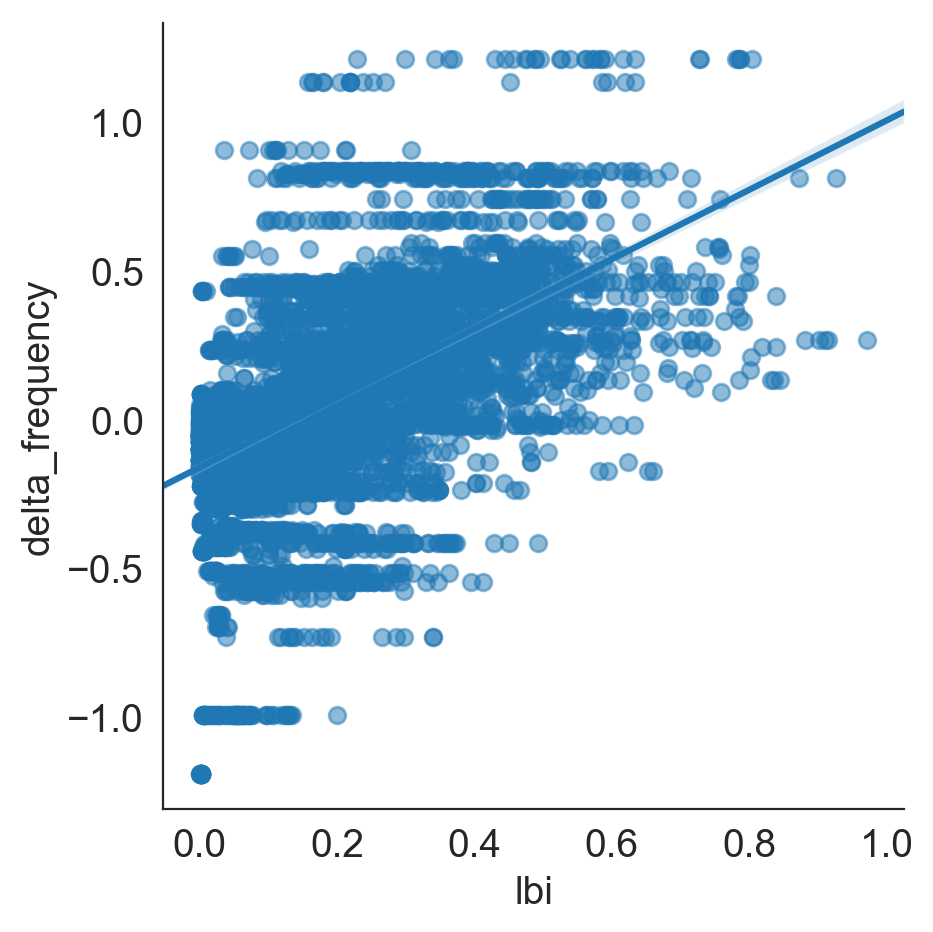

In [43]:
sns.lmplot("lbi", "delta_frequency", tip_attributes_df, scatter_kws={"alpha": 0.5})

## Summarize model residuals
[back to top](#Summarize-models)

In [44]:
residuals_by_timepoint = residual_df.groupby(["predictors", "timepoint"])["residual"].sum().reset_index()

In [45]:
residuals_by_timepoint.head()

,predictors,timepoint,residual
0,cTiterSub,1995-10-01,226.491189
1,cTiterSub,1996-04-01,207.506357
2,cTiterSub,1996-10-01,659.390481
3,cTiterSub,1997-04-01,347.779672
4,cTiterSub,1997-10-01,77.155786


In [46]:
residuals_by_timepoint.groupby("predictors")["residual"].sum()

predictors
cTiterSub                    90237.889747
cTiterSub_x                  89878.996667
delta_frequency             107292.483211
dms_star                     97313.518146
ep                           73660.388315
ep_x                         66247.575822
lbi                         123599.208989
lbi-cTiterSub_x-dms_star    127732.498732
lbi-ep_x-ne_star            128070.949866
naive                        87107.549140
ne_star                     111353.002563
Name: residual, dtype: float64

In [47]:
model_name = "lbi"

In [48]:
model_residuals_by_timepoint = residuals_by_timepoint[residuals_by_timepoint["predictors"] == model_name]

In [49]:
max_lags = 18

Text(0,0.5,'Number of clades')

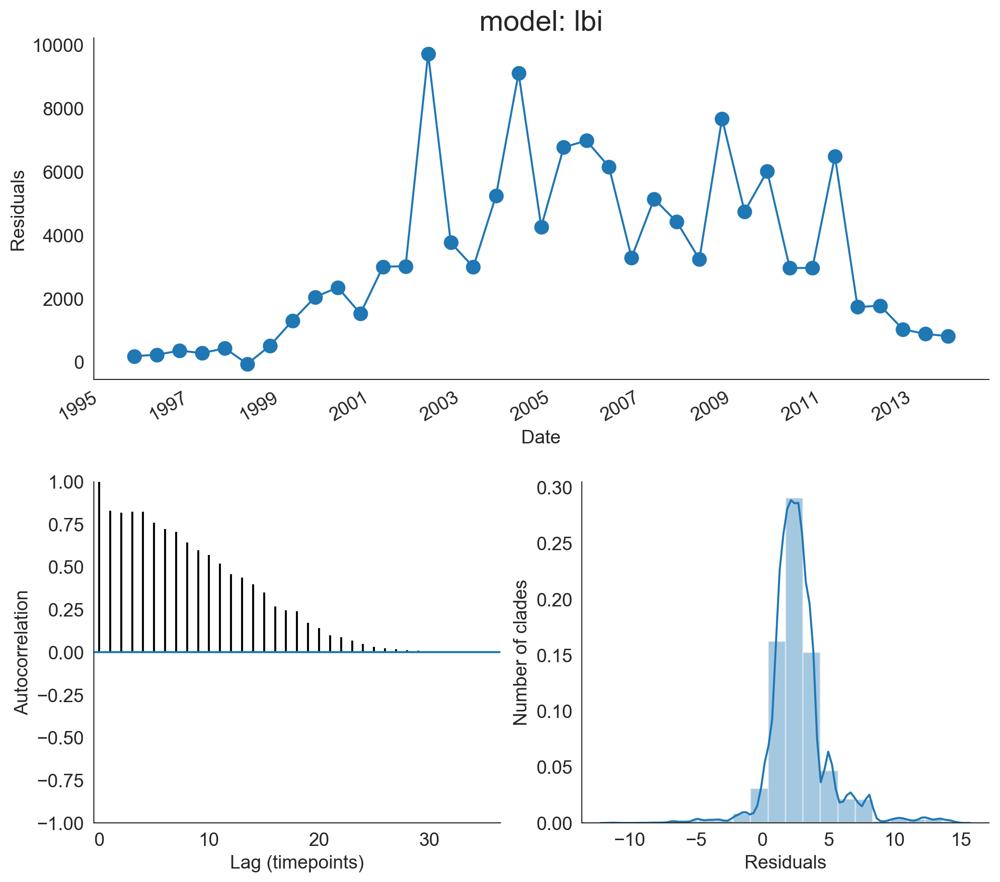

In [50]:
fig = plt.figure(figsize=(12, 12))
gs = gridspec.GridSpec(2, 2)
gs.update(hspace=0.3)

ax1 = plt.subplot(gs[0, :])
ax1.plot(model_residuals_by_timepoint["timepoint"], model_residuals_by_timepoint["residual"], "o-", markersize=10)
ax1.set_xlabel("Date")
ax1.set_ylabel("Residuals")
ax1.set_title("model: %s" % model_name)
plt.gcf().autofmt_xdate()

ax2 = plt.subplot(gs[1, :-1])
max_lags = len(model_residuals_by_timepoint["residual"]) - 1
lags, autocorrelation, lines, horizonal_lines = ax2.acorr(
    model_residuals_by_timepoint["residual"],
    maxlags=max_lags
)
ax2.set_xlabel("Lag (timepoints)")
ax2.set_ylabel("Autocorrelation")
ax2.set_xlim(-0.5, max_lags + 0.5)
ax2.set_ylim(-1, 1)

ax3 = plt.subplot(gs[1:, -1])
sns.distplot(residual_df.loc[residual_df["predictors"] == model_name, "residual"], ax=ax3, bins=20)
ax3.set_xlabel("Residuals")
ax3.set_ylabel("Number of clades")

### Residuals by predictor

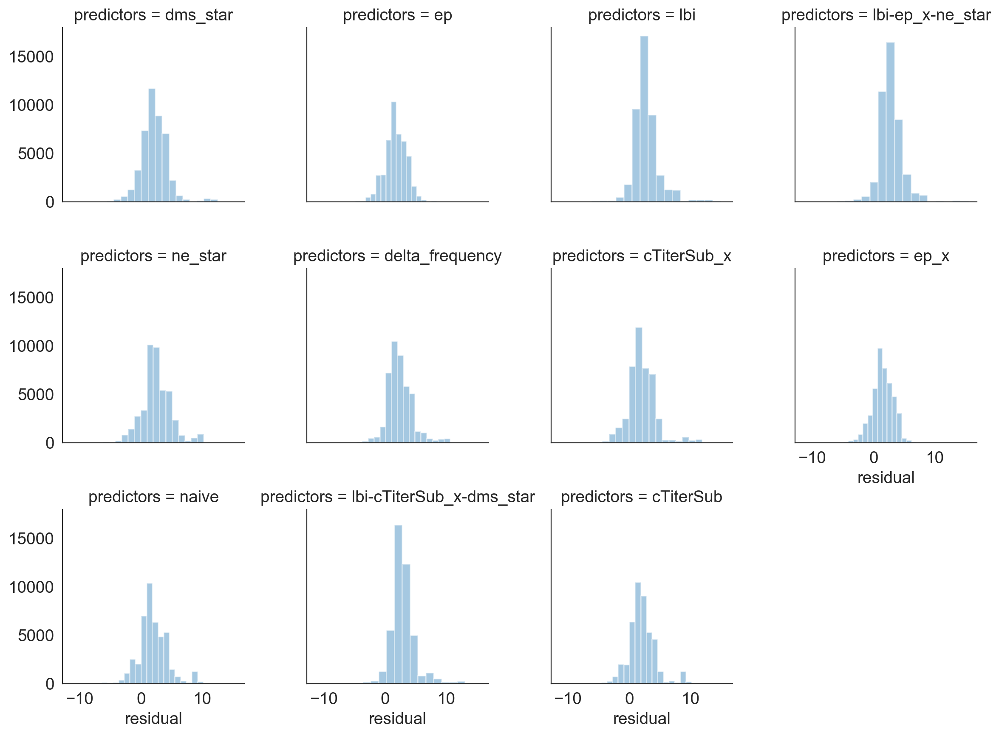

In [51]:
g = sns.FacetGrid(residual_df, col="predictors", col_wrap=4)
g.map(sns.distplot, "residual", bins=20, kde=False)

In [52]:
residual_df.groupby("predictors")["residual"].median().sort_values()

predictors
ep_x                        1.430780
ep                          1.576621
naive                       1.693099
cTiterSub_x                 1.724781
cTiterSub                   1.834602
dms_star                    2.006479
delta_frequency             2.086814
ne_star                     2.362427
lbi                         2.477507
lbi-cTiterSub_x-dms_star    2.648662
lbi-ep_x-ne_star            2.739574
Name: residual, dtype: float64

In [53]:
residual_df.groupby("predictors")["residual"].count()

predictors
cTiterSub                   44701
cTiterSub_x                 44701
delta_frequency             44701
dms_star                    44701
ep                          44701
ep_x                        44701
lbi                         44701
lbi-cTiterSub_x-dms_star    44701
lbi-ep_x-ne_star            44701
naive                       44701
ne_star                     44701
Name: residual, dtype: int64

In [54]:
(residual_df["residual"] < -0.01).sum()

51167

### Residuals by timepoint

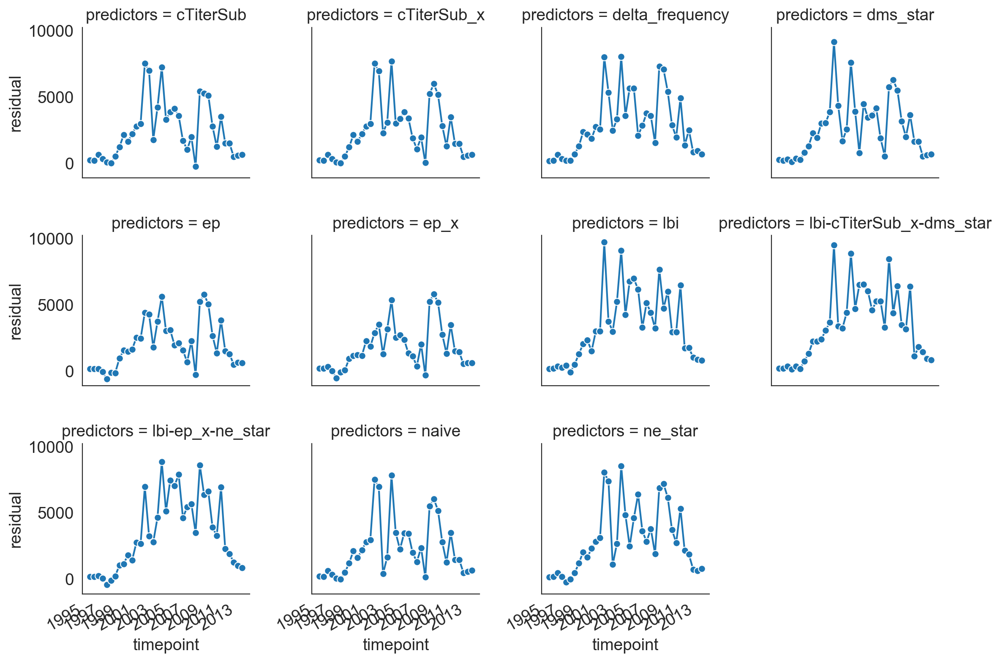

In [55]:
g = sns.FacetGrid(residuals_by_timepoint, col="predictors", col_wrap=4)
g.map(sns.lineplot, "timepoint", "residual", marker="o", linestyle="")
plt.gcf().autofmt_xdate()

In [56]:
np.abs(residuals_by_timepoint[residuals_by_timepoint["predictors"] == "lbi"]["residual"].values - residuals_by_timepoint[residuals_by_timepoint["predictors"] == "naive"]["residual"].values)

array([  39.20900832,   24.73388513,  296.67362971,   65.3025064 ,
        361.52829106,   62.58900037,   11.69731584,   91.80567161,
         96.87450059,  732.07906193,  689.57618094,  212.4248757 ,
         52.60137533, 2216.0564059 , 3213.53105594, 2582.42240956,
       3568.19846832, 1279.40712645,  768.02441073, 4517.34530295,
       3503.05276552, 2713.37187733, 1293.19284719, 3825.86337747,
       2050.92349782, 3083.45846646, 2174.69318748, 1324.96677005,
        839.23158636,  167.63806551, 1695.76753549, 2991.26379041,
        257.09222794,  289.95949407,  537.64183856,  307.41849227,
        154.883483  ])

### Autocorrelation of residuals

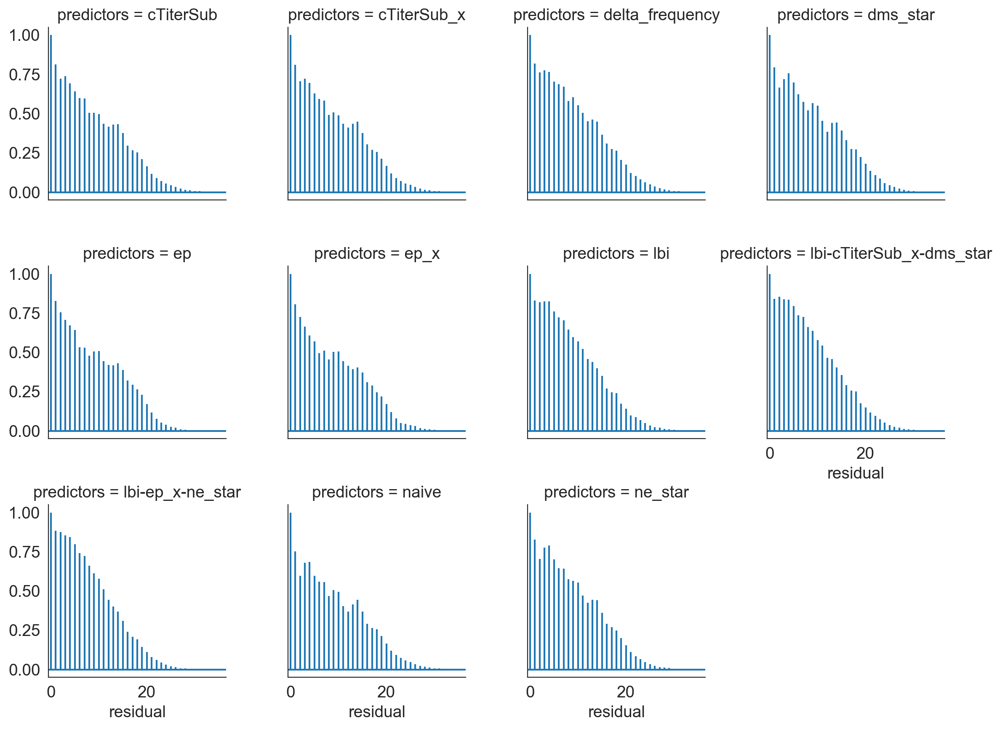

In [57]:
g = sns.FacetGrid(residuals_by_timepoint, col="predictors", col_wrap=4)
g.map(plt.acorr, "residual", maxlags=max_lags)

for ax in g.axes.flatten():
    ax.set_xlim(-0.5, max_lags + 0.5)

## Summarize observed and predicted distances
[back to top](#Summarize-models)

$$
d_{i}(x(t)) = \sum_{j}x_{j}d_{ij}
$$

$$
u = t + \Delta{t}
$$

$$
\hat{x}_{i}(t, u) = x_{i}(t)e^{(f_{i}(t)(u - t))}
$$

$$
y = x_{i}(t)d_{i}(x(u))
$$

$$
\hat{y} = x_{i}(t)d_{i}(\hat{x}(t, u))
$$

$$
D(x(t), x(u)) = \sum_{i}x_{i}d_{i}(u)
$$

$$
D(\hat{x}(t, u), x(u)) = \sum_{i}x_{i}e^{(f_{i}(t)(u - t))}d_{i}(u)
$$

$$
L = \sum_{t}D(\hat{x}(t, u), x(u))
$$

In [58]:
frequency_df[frequency_df["predictors"] == "lbi"].head()

,frequency,projected_frequency,strain,timepoint,weighted_distance_to_future_hat,weighted_distance_to_present,y_hat,weighted_distance_to_future,y,residual,validation_timepoint,predictors
9506,0.015263,0.005465,A/Argentina/1/2002,2002-10-01,18.275491,12.719145,14.043311,18.275491,18.275491,4.232180,2002-10-01,lbi
9507,0.002922,0.002913,A/Auckland/615/2002,2002-10-01,19.025516,9.925928,12.402379,19.025516,19.025516,6.623137,2002-10-01,lbi
9508,0.005491,0.004299,A/Bangkok/103/2002,2002-10-01,18.233858,9.193566,11.678673,18.233858,18.233858,6.555185,2002-10-01,lbi
9509,0.006722,0.007319,A/Bangkok/109/2002,2002-10-01,21.078948,11.705114,14.143078,21.078948,21.078948,6.935870,2002-10-01,lbi
9510,0.016552,0.009218,A/Bangkok/190/2002,2002-10-01,8.721310,10.102699,8.928259,8.721310,8.721310,-0.206949,2002-10-01,lbi


In [59]:
frequency_df["observed_rank"] = frequency_df["y"] # / frequency_df["frequency"]
frequency_df["estimated_rank"] = frequency_df["y_hat"] # / frequency_df["frequency"]

In [60]:
data_to_plot = frequency_df[frequency_df["predictors"] == "lbi"]

In [61]:
minimum_observed_distance = data_to_plot.groupby("validation_timepoint")["observed_rank"].min().reset_index()

In [62]:
minimum_estimated_distance = data_to_plot.groupby("validation_timepoint")["estimated_rank"].min().reset_index()

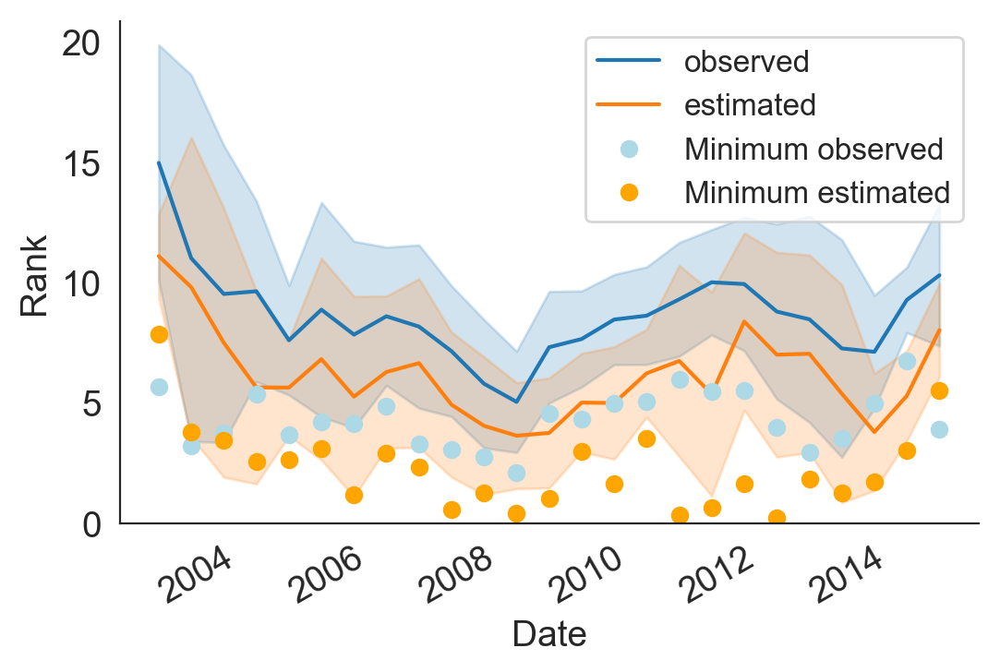

In [63]:
fig, ax = plt.subplots(1, 1, figsize=(6, 4))

ax = sns.lineplot(
    "validation_timepoint",
    "observed_rank",
    data=data_to_plot,
    ci="sd",
    label="observed",
    ax=ax
)

ax = sns.lineplot(
    "validation_timepoint",
    "estimated_rank",
    data=data_to_plot,
    ci="sd",
    label="estimated",
    ax=ax
)

ax.plot(
    minimum_observed_distance["validation_timepoint"],
    minimum_observed_distance["observed_rank"],
    "o",
    color="lightblue",
    label="Minimum observed"
)

ax.plot(
    minimum_estimated_distance["validation_timepoint"],
    minimum_estimated_distance["estimated_rank"],
    "o",
    color="orange",
    label="Minimum estimated"
)

ax.legend()
ax.set_xlabel("Date")
ax.set_ylabel("Rank")
ax.set_ylim(bottom=0)
plt.gcf().autofmt_xdate()

In [64]:
vaccine_strains = [
    "A/Wisconsin/67/2005",
    "A/Brisbane/10/2007",
    "A/Perth/16/2009",
    "A/Victoria/361/2011",
    "A/Texas/50/2012",
    "A/Switzerland/9715293/2013",
    "A/HongKong/4801/2014"
]

In [65]:
vaccine_strain_data_to_plot = data_to_plot.loc[data_to_plot["strain"].isin(vaccine_strains),
                                               ["strain", "validation_timepoint", "observed_rank", "estimated_rank"]]

In [66]:
vaccine_strain_data_to_plot

,strain,validation_timepoint,observed_rank,estimated_rank
11903,A/Perth/16/2009,2009-10-01,7.896906,2.628771
13002,A/Victoria/361/2011,2012-04-01,6.362648,3.156554
13222,A/Texas/50/2012,2012-10-01,5.447271,4.499240
13808,A/HongKong/4801/2014,2014-04-01,6.746404,10.058739
13946,A/Switzerland/9715293/2013,2014-04-01,8.341285,6.813539
14063,A/HongKong/4801/2014,2014-10-01,3.905091,6.270359


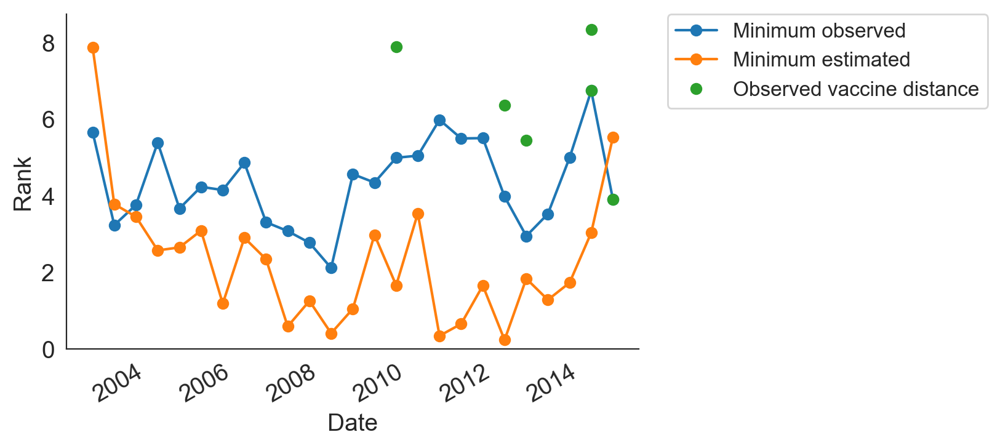

In [67]:
fig, ax = plt.subplots(1, 1, figsize=(6, 4))

ax.plot(
    minimum_observed_distance["validation_timepoint"],
    minimum_observed_distance["observed_rank"],
    "o-",
    label="Minimum observed"
)

ax.plot(
    minimum_estimated_distance["validation_timepoint"],
    minimum_estimated_distance["estimated_rank"],
    "o-",
    label="Minimum estimated"
)

ax.plot(
    vaccine_strain_data_to_plot["validation_timepoint"],
    vaccine_strain_data_to_plot["observed_rank"],
    "o",
    label="Observed vaccine distance"
)

ax.set_xlabel("Date")
ax.set_ylabel("Rank")
ax.set_ylim(bottom=0)
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
plt.gcf().autofmt_xdate()

In [68]:
regressions = []
for predictors, group_df in frequency_df.groupby(["predictors"]):
    slope, intercept, r_value, p_value, std_err = linregress(
        group_df["y"],
        group_df["y_hat"]
    )
    
    regressions.append({
        "predictors": predictors,
        "slope": slope,
        "intercept": intercept,
        "r_value": r_value,
        "r_2": r_value ** 2,
        "p_value": p_value
    })

regressions = pd.DataFrame(regressions).sort_values(by="r_2", ascending=False)

In [69]:
regressions

,intercept,p_value,predictors,r_2,r_value,slope
6,-1.621949,0.0,lbi,0.776598,0.881248,0.894984
8,-1.721026,0.0,lbi-ep_x-ne_star,0.723246,0.850439,0.923441
2,-0.441718,0.0,delta_frequency,0.682115,0.825902,0.780498
4,1.105445,0.0,ep,0.671107,0.819211,0.678767
3,0.764037,0.0,dms_star,0.666663,0.816494,0.674090
9,1.151338,0.0,naive,0.654832,0.809217,0.644088
5,1.492636,0.0,ep_x,0.615279,0.784397,0.696679
10,0.637662,0.0,ne_star,0.613750,0.783422,0.648624
0,1.771504,0.0,cTiterSub,0.499888,0.707027,0.590582
7,-0.239861,0.0,lbi-cTiterSub_x-dms_star,0.469800,0.685419,0.792156


In [70]:
regressions_order = regressions["predictors"].values

In [71]:
regressions_order

array(['lbi', 'lbi-ep_x-ne_star', 'delta_frequency', 'ep', 'dms_star',
       'naive', 'ep_x', 'ne_star', 'cTiterSub',
       'lbi-cTiterSub_x-dms_star', 'cTiterSub_x'], dtype=object)

In [72]:
final_frequency_df = frequency_df[frequency_df["predictors"].isin(best_models)].copy()

In [73]:
final_frequency_df["predictors_name"] = final_frequency_df["predictors"].map(dict(zip(best_models, best_predictor_names)))

In [74]:
final_frequency_df.head()

,frequency,projected_frequency,strain,timepoint,weighted_distance_to_future_hat,weighted_distance_to_present,y_hat,weighted_distance_to_future,y,residual,validation_timepoint,predictors,observed_rank,estimated_rank,predictors_name
0,0.015263,0.012075,A/Argentina/1/2002,2002-10-01,18.275491,12.719145,13.394808,18.275491,18.275491,4.880683,2002-10-01,dms_star,18.275491,13.394808,DMS phenotypes
1,0.002922,0.002408,A/Auckland/615/2002,2002-10-01,19.025516,9.925928,11.810088,19.025516,19.025516,7.215428,2002-10-01,dms_star,19.025516,11.810088,DMS phenotypes
2,0.005491,0.003853,A/Bangkok/103/2002,2002-10-01,18.233858,9.193566,11.051976,18.233858,18.233858,7.181882,2002-10-01,dms_star,18.233858,11.051976,DMS phenotypes
3,0.006722,0.001784,A/Bangkok/109/2002,2002-10-01,21.078948,11.705114,13.782334,21.078948,21.078948,7.296614,2002-10-01,dms_star,21.078948,13.782334,DMS phenotypes
4,0.016552,0.036848,A/Bangkok/190/2002,2002-10-01,8.721310,10.102699,8.354648,8.721310,8.721310,0.366662,2002-10-01,dms_star,8.721310,8.354648,DMS phenotypes


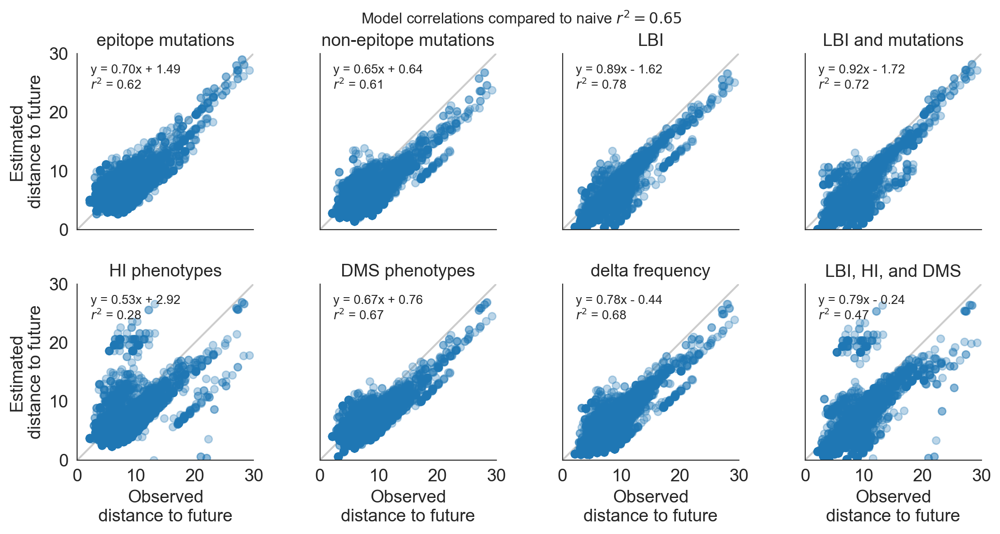

In [75]:
max_y = 30
x = y = np.linspace(0, max_y, 10)

g = sns.FacetGrid(final_frequency_df, col="predictors_name", col_wrap=4, col_order=best_predictor_names)
g.map(plt.plot, "y", "y_hat", marker="o", linestyle="", alpha=0.3)
g.set_titles("{col_name}")
g.set_axis_labels("Observed\ndistance to future", "Estimated\ndistance to future")

for ((i, j, k), facet_df), ax in zip(g.facet_data(), g.axes.flat):
    ax.plot(x, y, color="#cccccc", zorder=-10)
    
    slope, intercept, r_value, p_value = regressions.loc[
        regressions["predictors"] == facet_df["predictors"].unique()[0],
        ["slope", "intercept", "r_value", "p_value"]
    ].values[0]
    
    if p_value > 0.001:
        p_value = "\nP value = %.3f" % p_value
    else:
        p_value = ""
    
    if intercept < 0:
        intercept_operator = "-"
        intercept = -intercept
    else:
        intercept_operator = "+"
    
    ax.text(
        0.075,
        0.8,
        "y = %.2fx %s %.2f\n$r^2$ = %.2f%s" % (slope, intercept_operator, intercept, r_value ** 2, p_value),
        transform=ax.transAxes,
        fontsize=10
    )
    ax.set_aspect("equal")
    ax.set_xlim(0, max_y)
    ax.set_ylim(0, max_y)
    
plt.suptitle(
    "Model correlations compared to naive $r^2 = %.2f$" % regressions.loc[regressions["predictors"] == "naive", "r_2"].values[0],
    fontsize=12,
    y=1.0
)
plt.subplots_adjust(hspace=0.75, top=0.75, wspace=0.05)
plt.tight_layout()

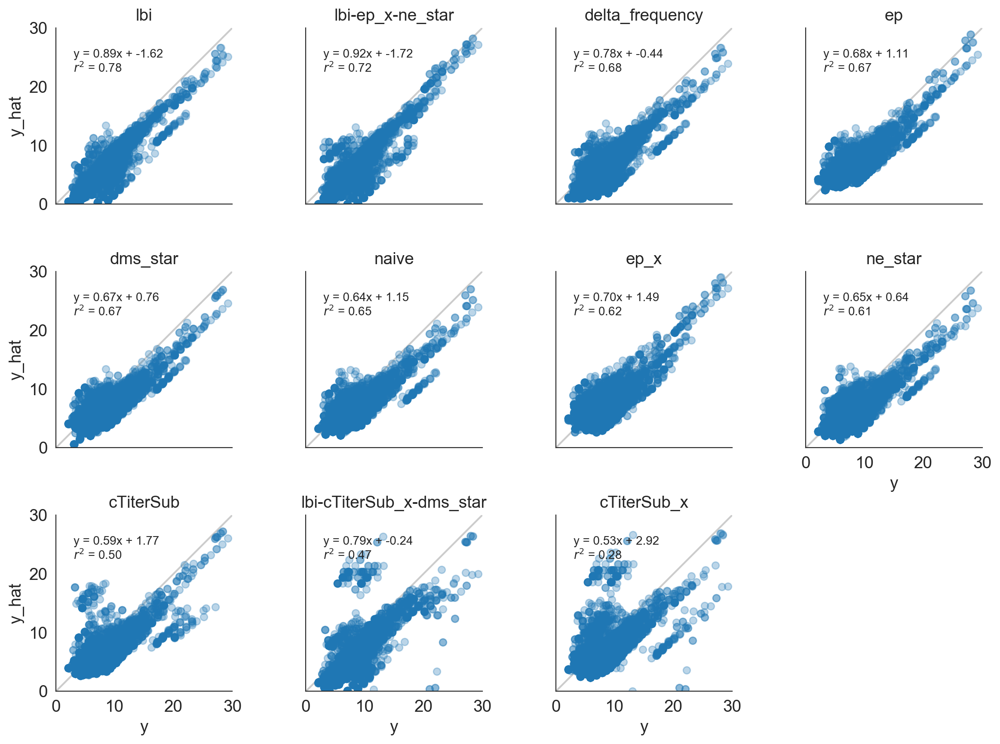

In [76]:
max_y = 30
x = y = np.linspace(0, max_y, 10)

g = sns.FacetGrid(frequency_df, col="predictors", col_wrap=4, col_order=regressions_order)
g.map(plt.plot, "y", "y_hat", marker="o", linestyle="", alpha=0.3)
g.set_titles("{col_name}")

for ((i, j, k), facet_df), ax in zip(g.facet_data(), g.axes.flat):
    slope, intercept, r_value, p_value = regressions.loc[
        regressions["predictors"] == facet_df["predictors"].unique()[0],
        ["slope", "intercept", "r_value", "p_value"]
    ].values[0]
    
    if p_value > 0.001:
        p_value = "\nP value = %.3f" % p_value
    else:
        p_value = ""
    
    ax.plot(x, y, color="#cccccc", zorder=-10)
    
    ax.text(
        0.1,
        0.75,
        "y = %.2fx + %.2f\n$r^2$ = %.2f%s" % (slope, intercept, r_value ** 2, p_value),
        transform=ax.transAxes,
        fontsize=10
    )
    ax.set_aspect("equal")
    ax.set_xlim(0, max_y)
    ax.set_ylim(0, max_y)

Text(0.35,0.75,'mean = 8.59')

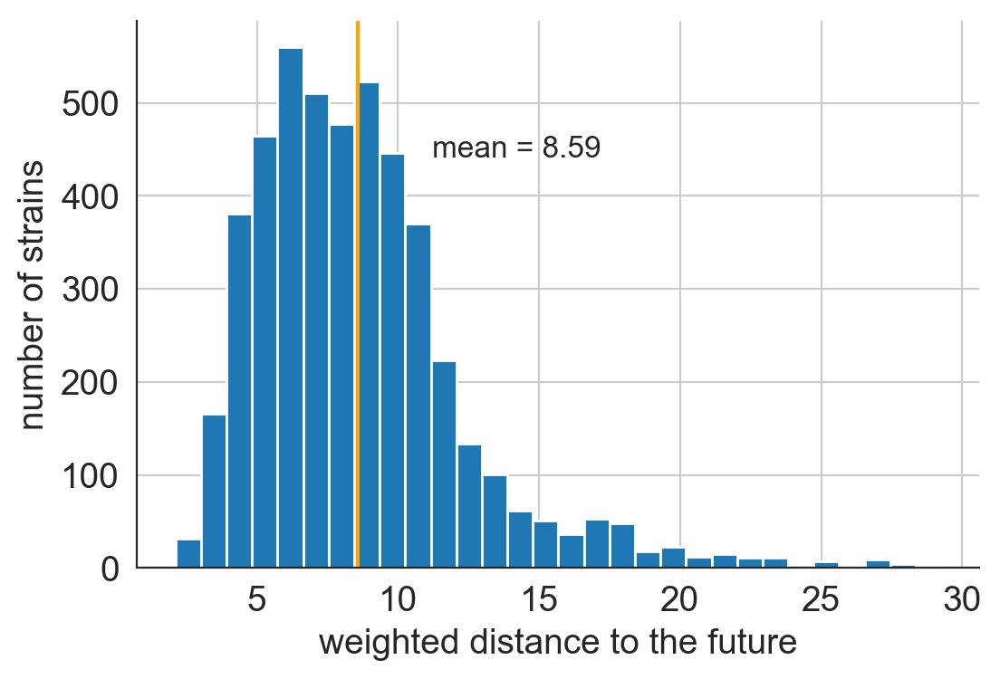

In [77]:
ax = frequency_df[frequency_df["predictors"] == "naive"]["y"].hist(bins=30)
ax.set_xlabel("weighted distance to the future")
ax.set_ylabel("number of strains")

mean_y = frequency_df[frequency_df["predictors"] == "naive"]["y"].mean()
ax.axvline(
    x=mean_y,
    color="orange"
)

ax.text(
    0.35,
    0.75,
    "mean = %.2f" % (mean_y,),
    transform=ax.transAxes,
    fontsize=12
)


Text(0.35,0.75,'mean = 6.61')

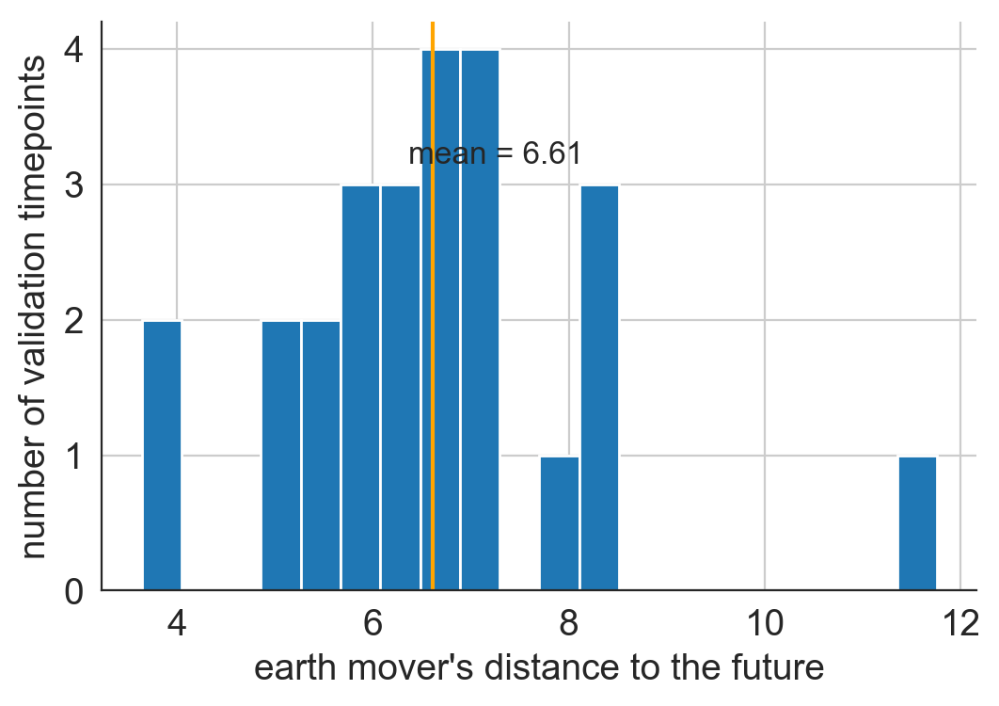

In [78]:
ax = errors_by_time_df[errors_by_time_df["predictors"] == "naive"]["validation_error"].hist(bins=20)
ax.set_xlabel("earth mover's distance to the future")
ax.set_ylabel("number of validation timepoints")

mean_y = errors_by_time_df[errors_by_time_df["predictors"] == "naive"]["validation_error"].mean()
ax.axvline(
    x=mean_y,
    color="orange"
)

ax.text(
    0.35,
    0.75,
    "mean = %.2f" % (mean_y,),
    transform=ax.transAxes,
    fontsize=12
)


In [79]:
best_models = [
    "naive",
    "lbi-dms_star-cTiterSub_x",
    "lbi-delta_frequency",
    "lbi",
    "lbi-ep_x-ne_star"
]

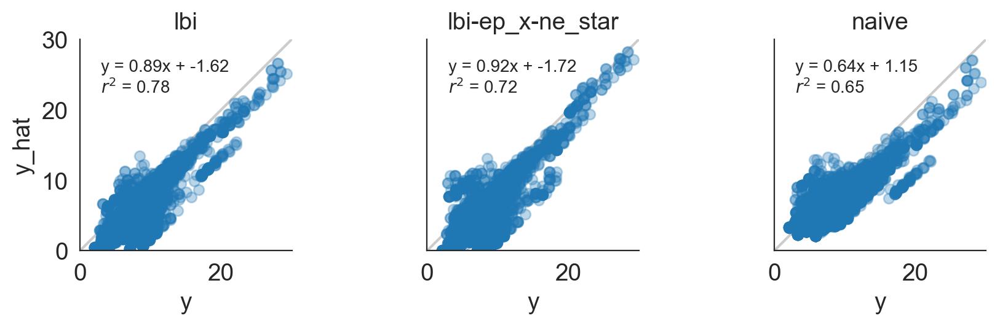

In [80]:
max_y = 30
x = y = np.linspace(0, max_y, 10)

g = sns.FacetGrid(frequency_df[frequency_df["predictors"].isin(best_models)], col="predictors", col_wrap=4)
g.map(plt.plot, "y", "y_hat", marker="o", linestyle="", alpha=0.3)
g.set_titles("{col_name}")

for ((i, j, k), facet_df), ax in zip(g.facet_data(), g.axes.flat):
    slope, intercept, r_value, p_value, std_err = linregress(
        facet_df["y"],
        facet_df["y_hat"]
    )
    
    if p_value > 0.001:
        p_value = "\nP value = %.3f" % p_value
    else:
        p_value = ""
    
    ax.plot(x, y, color="#cccccc", zorder=-10)
    
    ax.text(
        0.1,
        0.75,
        "y = %.2fx + %.2f\n$r^2$ = %.2f%s" % (slope, intercept, r_value ** 2, p_value),
        transform=ax.transAxes,
        fontsize=10
    )
    ax.set_aspect("equal")
    ax.set_xlim(0, max_y)
    ax.set_ylim(0, max_y)

In [81]:
frequency_df["year_month"] = frequency_df["validation_timepoint"].dt.strftime("%Y-%m")
frequency_df["year"] = frequency_df["validation_timepoint"].dt.strftime("%Y")

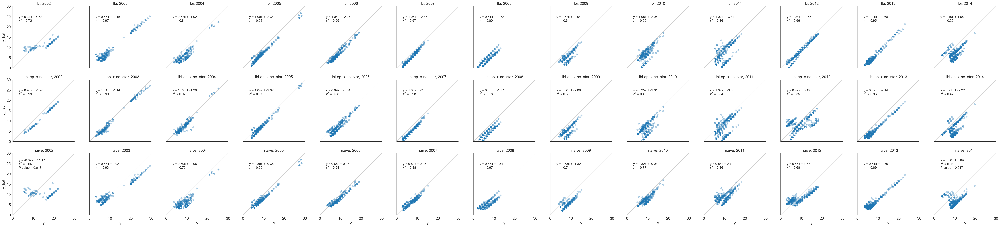

In [82]:
max_y = 30
x = y = np.linspace(0, max_y, 10)

g = sns.FacetGrid(frequency_df[frequency_df["predictors"].isin(best_models)], row="predictors", col="year", height=4)
g.map(plt.plot, "y", "y_hat", marker="o", linestyle="", alpha=0.3)
g.set_titles("{row_name}, {col_name}")

regressions_by_time = []
for ((i, j, k), facet_df), ax in zip(g.facet_data(), g.axes.flat):
    slope, intercept, r_value, p_value, std_err = linregress(
        facet_df["y"],
        facet_df["y_hat"]
    )
    
    regressions_by_time.append({
        "predictors": facet_df["predictors"].unique()[0],
        "timepoint": facet_df["timepoint"].unique()[0],
        "slope": slope,
        "intercept": intercept,
        "r_value": r_value,
        "p_value": p_value
    })
    
    if p_value > 0.001:
        p_value = "\nP value = %.3f" % p_value
    else:
        p_value = ""
    
    ax.plot(x, y, color="#cccccc", zorder=-10)
    
    ax.text(
        0.1,
        0.75,
        "y = %.2fx + %.2f\n$r^2$ = %.2f%s" % (slope, intercept, r_value ** 2, p_value),
        transform=ax.transAxes,
        fontsize=12
    )
    ax.set_aspect("equal")
    ax.set_xlim(0, max_y)
    ax.set_ylim(0, max_y)
    
plt.tight_layout()

In [83]:
frequency_df.head()

,frequency,projected_frequency,strain,timepoint,weighted_distance_to_future_hat,weighted_distance_to_present,y_hat,weighted_distance_to_future,y,residual,validation_timepoint,predictors,observed_rank,estimated_rank,year_month,year
0,0.015263,0.012075,A/Argentina/1/2002,2002-10-01,18.275491,12.719145,13.394808,18.275491,18.275491,4.880683,2002-10-01,dms_star,18.275491,13.394808,2002-10,2002
1,0.002922,0.002408,A/Auckland/615/2002,2002-10-01,19.025516,9.925928,11.810088,19.025516,19.025516,7.215428,2002-10-01,dms_star,19.025516,11.810088,2002-10,2002
2,0.005491,0.003853,A/Bangkok/103/2002,2002-10-01,18.233858,9.193566,11.051976,18.233858,18.233858,7.181882,2002-10-01,dms_star,18.233858,11.051976,2002-10,2002
3,0.006722,0.001784,A/Bangkok/109/2002,2002-10-01,21.078948,11.705114,13.782334,21.078948,21.078948,7.296614,2002-10-01,dms_star,21.078948,13.782334,2002-10,2002
4,0.016552,0.036848,A/Bangkok/190/2002,2002-10-01,8.721310,10.102699,8.354648,8.721310,8.721310,0.366662,2002-10-01,dms_star,8.721310,8.354648,2002-10,2002


In [84]:
regressions_by_time = []
for (predictors, timepoint), group_df in frequency_df.groupby(["predictors", "timepoint"]):
    slope, intercept, r_value, p_value, std_err = linregress(
        group_df["y"],
        group_df["y_hat"]
    )
    
    regressions_by_time.append({
        "predictors": predictors,
        "timepoint": timepoint,
        "slope": slope,
        "intercept": intercept,
        "r_value": r_value,
        "p_value": p_value
    })

regressions_by_time = pd.DataFrame(regressions_by_time)

In [85]:
regressions_by_time.head()

,intercept,p_value,predictors,r_value,slope,timepoint
0,11.173523,1.330471e-02,cTiterSub,-0.235393,-0.071432,2002-10-01
1,16.900791,6.465937e-23,cTiterSub,-0.756156,-0.250954,2003-04-01
2,-2.078674,5.336894e-107,cTiterSub,0.984902,0.965765,2003-10-01
3,-3.611301,1.503951e-81,cTiterSub,0.951939,1.005671,2004-04-01
4,0.113332,2.180881e-76,cTiterSub,0.947863,0.769467,2004-10-01


In [86]:
naive_regressions_by_time = regressions_by_time[regressions_by_time["predictors"] == "naive"]
non_naive_regressions_by_time = regressions_by_time[regressions_by_time["predictors"] != "naive"]

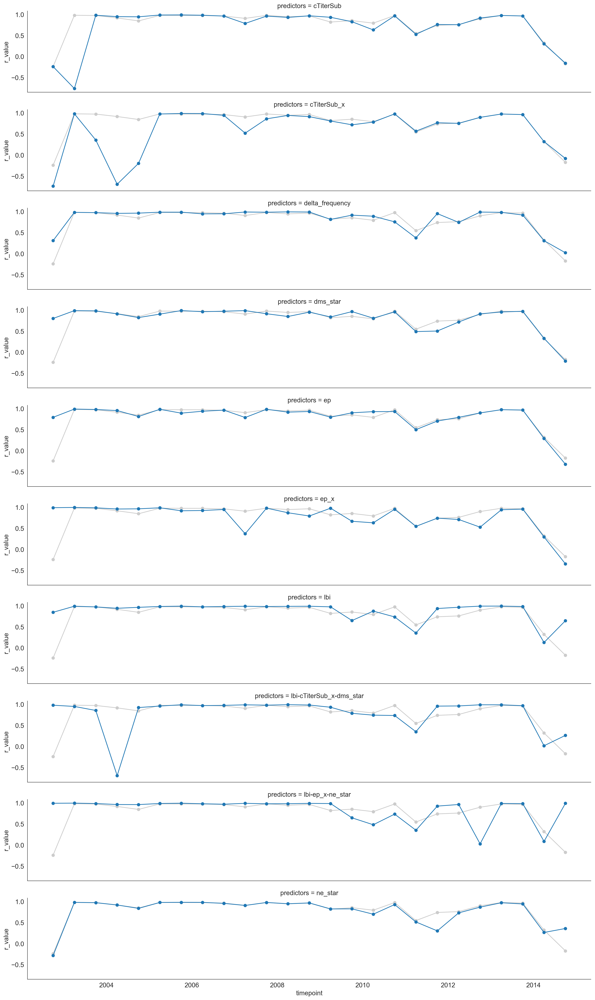

In [87]:
g = sns.FacetGrid(non_naive_regressions_by_time, row="predictors", aspect=6)
g.map(
    plt.plot,
    "timepoint",
    "r_value",
    marker="o"
)

for ax in g.axes.flatten():
    ax.plot(
        naive_regressions_by_time["timepoint"],
        naive_regressions_by_time["r_value"],
        marker="o",
        color="#cccccc",
        zorder=-10
    )

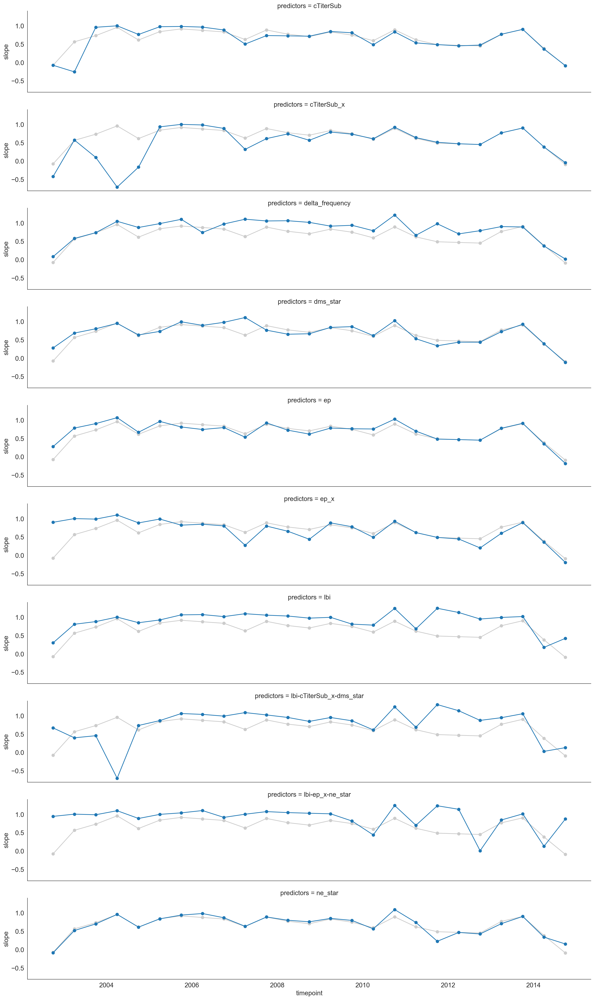

In [88]:
g = sns.FacetGrid(non_naive_regressions_by_time, row="predictors", aspect=6)
g.map(
    plt.plot,
    "timepoint",
    "slope",
    marker="o"
)

for ax in g.axes.flatten():
    ax.plot(
        naive_regressions_by_time["timepoint"],
        naive_regressions_by_time["slope"],
        marker="o",
        color="#cccccc",
        zorder=-10
    )

In [89]:
"""
max_y = 25
x = y = np.linspace(0, max_y, 10)

g = sns.FacetGrid(frequency_df, row="predictors", col="year_month", height=4)
g.map(plt.plot, "y", "y_hat", marker="o", linestyle="", alpha=0.3)
g.set_titles("{row_name}, {col_name}")

regressions_by_time = []
for ((i, j, k), facet_df), ax in zip(g.facet_data(), g.axes.flat):
    slope, intercept, r_value, p_value, std_err = linregress(
        facet_df["y"],
        facet_df["y_hat"]
    )
    
    regressions_by_time.append({
        "predictors": facet_df["predictors"].unique()[0],
        "timepoint": facet_df["timepoint"].unique()[0],
        "slope": slope,
        "intercept": intercept,
        "r_value": r_value,
        "p_value": p_value
    })
    
    if p_value > 0.001:
        p_value = "\nP value = %.3f" % p_value
    else:
        p_value = ""
    
    ax.plot(x, y, color="#cccccc", zorder=-10)
    
    ax.text(
        0.1,
        0.75,
        "y = %.2fx + %.2f\n$r^2$ = %.2f%s" % (slope, intercept, r_value ** 2, p_value),
        transform=ax.transAxes,
        fontsize=12
    )
    ax.set_aspect("equal")
    ax.set_xlim(0, max_y)
    ax.set_ylim(0, max_y)
    
plt.tight_layout()"""

'\nmax_y = 25\nx = y = np.linspace(0, max_y, 10)\n\ng = sns.FacetGrid(frequency_df, row="predictors", col="year_month", height=4)\ng.map(plt.plot, "y", "y_hat", marker="o", linestyle="", alpha=0.3)\ng.set_titles("{row_name}, {col_name}")\n\nregressions_by_time = []\nfor ((i, j, k), facet_df), ax in zip(g.facet_data(), g.axes.flat):\n    slope, intercept, r_value, p_value, std_err = linregress(\n        facet_df["y"],\n        facet_df["y_hat"]\n    )\n    \n    regressions_by_time.append({\n        "predictors": facet_df["predictors"].unique()[0],\n        "timepoint": facet_df["timepoint"].unique()[0],\n        "slope": slope,\n        "intercept": intercept,\n        "r_value": r_value,\n        "p_value": p_value\n    })\n    \n    if p_value > 0.001:\n        p_value = "\nP value = %.3f" % p_value\n    else:\n        p_value = ""\n    \n    ax.plot(x, y, color="#cccccc", zorder=-10)\n    \n    ax.text(\n        0.1,\n        0.75,\n        "y = %.2fx + %.2f\n$r^2$ = %.2f%s" % (slop

## Summarize model forecasting error
[back to top](#Summarize-models)

### Earth mover's distances

Training and validation errors are reported as [earth mover's distances](https://en.wikipedia.org/wiki/Earth_mover%27s_distance). These values minimize the distance between observed and projected frequencies of tips at each timepoint with Hamming distance between amino acid sequences providing the ground distance between each pair of tips in respective timepoints.

In [90]:
errors_by_time_df.head()

,predictors,validation_error,validation_n,validation_timepoint
0,dms_star,8.680402,110,2002-10-01
1,dms_star,6.992349,117,2003-04-01
2,dms_star,7.211693,140,2003-10-01
3,dms_star,7.379968,157,2004-04-01
4,dms_star,6.121948,152,2004-10-01


In [91]:
distance_df = errors_by_time_df.groupby("predictors")["validation_error"].aggregate([
    "sum",
    "mean",
    "median"
]).sort_values(by="sum").reset_index()

In [92]:
distance_df

,predictors,sum,mean,median
0,lbi,134.814380,5.392575,5.209475
1,lbi-ep_x-ne_star,136.225152,5.449006,4.926944
2,delta_frequency,150.850078,6.034003,6.053008
3,lbi-cTiterSub_x-dms_star,159.071852,6.362874,5.646826
4,dms_star,159.243187,6.369727,6.487453
5,ne_star,162.185705,6.487428,6.395886
6,naive,165.231949,6.609278,6.631146
7,ep,165.381948,6.615278,6.636520
8,ep_x,168.635957,6.745438,6.768780
9,cTiterSub,171.388595,6.855544,6.348382


In [93]:
distance_df.loc[distance_df["predictors"] == "naive", "sum"].values[0]

165.23194861412048

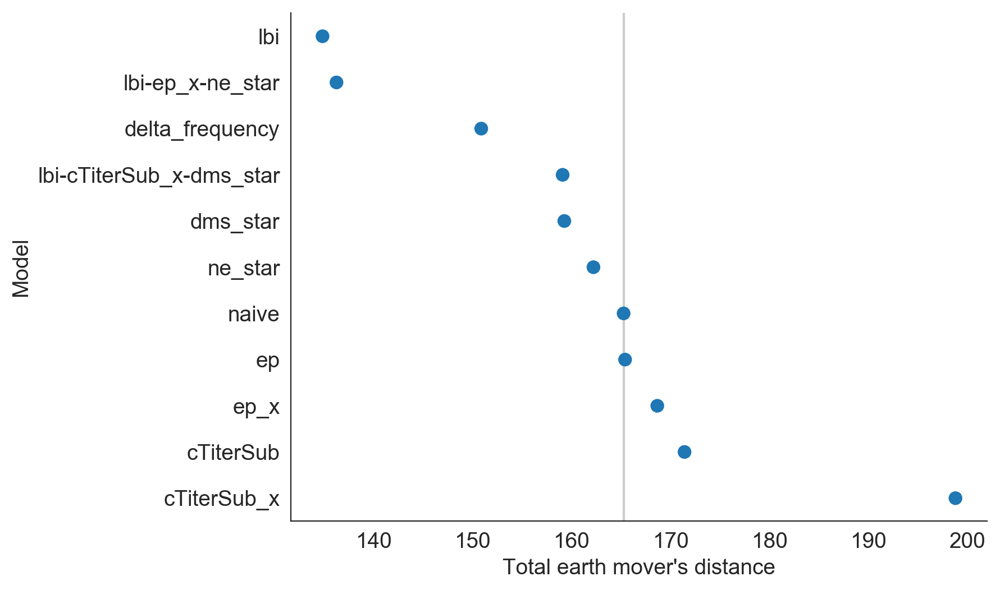

In [94]:
fig, ax = plt.subplots(1, 1, figsize=(8, 6))
sns.pointplot(
    x="sum",
    y="predictors",
    data=distance_df,
    join=False,
    ax=ax
)

ax.set_xlabel("Total earth mover's distance")
ax.set_ylabel("Model")
ax.axvline(
    x=distance_df.loc[distance_df["predictors"] == "naive", "sum"].values[0],
    color="#cccccc",
    zorder=-10
)

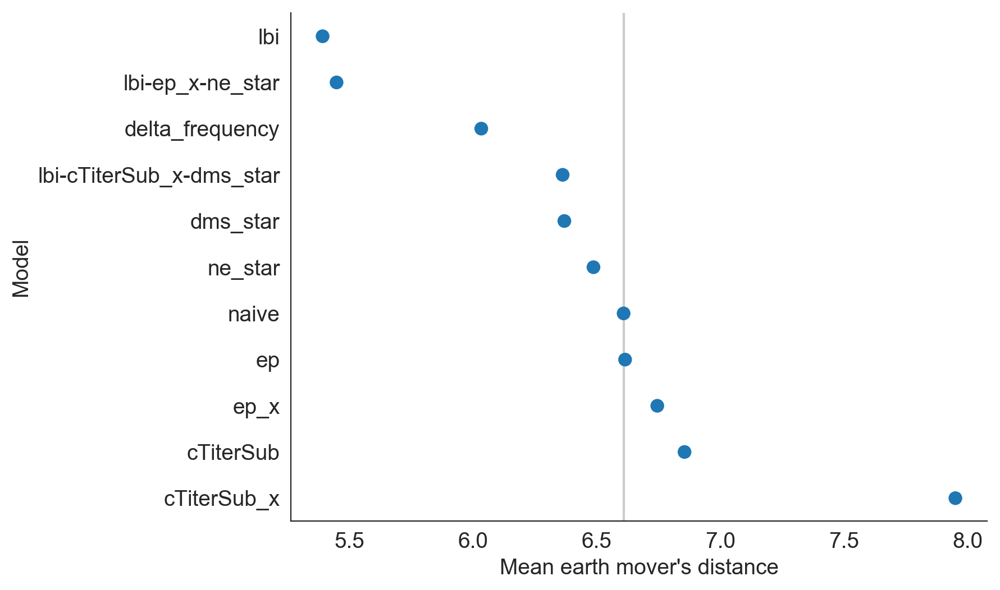

In [95]:
fig, ax = plt.subplots(1, 1, figsize=(8, 6))
sns.pointplot(
    x="mean",
    y="predictors",
    data=distance_df,
    join=False,
    ax=ax
)

ax.set_xlabel("Mean earth mover's distance")
ax.set_ylabel("Model")

ax.axvline(
    x=distance_df.loc[distance_df["predictors"] == "naive", "mean"].values[0],
    color="#cccccc",
    zorder=-10
)

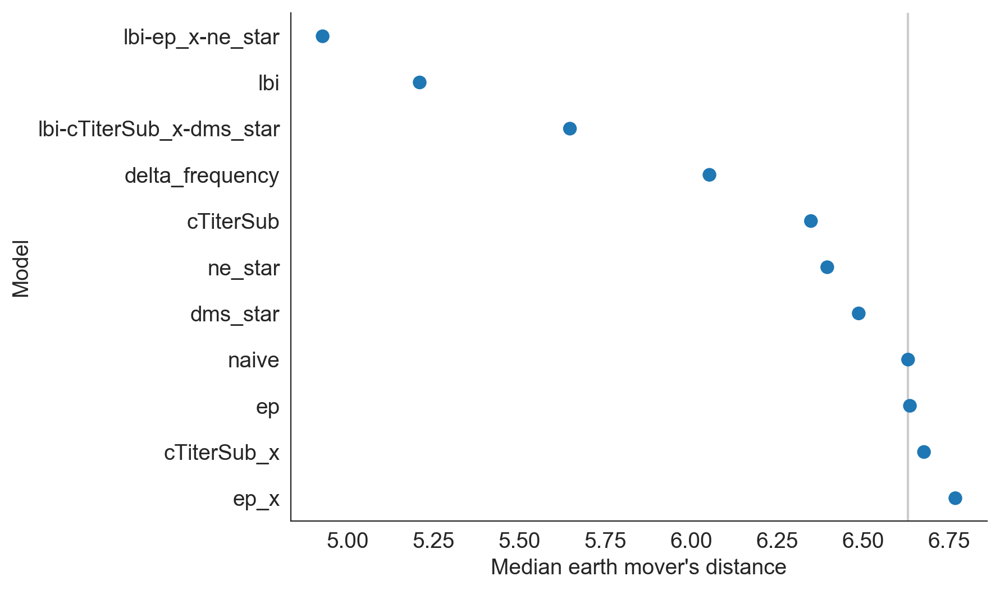

In [96]:
fig, ax = plt.subplots(1, 1, figsize=(8, 6))
sns.pointplot(
    x="median",
    y="predictors",
    data=distance_df,
    join=False,
    ax=ax,
    order=distance_df.sort_values("median").loc[:, "predictors"]
)

ax.set_xlabel("Median earth mover's distance")
ax.set_ylabel("Model")

ax.axvline(
    x=distance_df.loc[distance_df["predictors"] == "naive", "median"].values[0],
    color="#cccccc",
    zorder=-10
)

In [97]:
errors_by_time_df.head()

,predictors,validation_error,validation_n,validation_timepoint
0,dms_star,8.680402,110,2002-10-01
1,dms_star,6.992349,117,2003-04-01
2,dms_star,7.211693,140,2003-10-01
3,dms_star,7.379968,157,2004-04-01
4,dms_star,6.121948,152,2004-10-01


In [98]:
predictor_type_order = [
    "naive",
    "ep",
    "cTiterSub",
    "ep_x",
    "cTiterSub_x",
    "ne_star",
    "dms_star",
    "lbi",
    "delta_frequency"
]

In [99]:
predictor_names = [
    "null",
    "epitope mutations",
    "HI phenotypes",
    "epitope cross-immunity",
    "HI cross-immunity",
    "non-epitope mutations",
    "DMS mutation effects",
    "LBI",
    "delta frequency"
]

In [100]:
"""
predictor_type_order = [
    "naive",
    "lbi"
]
predictor_names = predictor_type_order
"""

'\npredictor_type_order = [\n    "naive",\n    "lbi"\n]\npredictor_names = predictor_type_order\n'

In [101]:
predictor_name_by_id = dict(zip(predictor_type_order, predictor_names))

In [102]:
predictor_name_by_id

{'naive': 'null',
 'ep': 'epitope mutations',
 'cTiterSub': 'HI phenotypes',
 'ep_x': 'epitope cross-immunity',
 'cTiterSub_x': 'HI cross-immunity',
 'ne_star': 'non-epitope mutations',
 'dms_star': 'DMS mutation effects',
 'lbi': 'LBI',
 'delta_frequency': 'delta frequency'}

In [103]:
errors_by_time_df["predictors_name"] = errors_by_time_df["predictors"].map(predictor_name_by_id)

In [104]:
errors_by_time_df[errors_by_time_df["predictors"] == "naive"]

,predictors,validation_error,validation_n,validation_timepoint,predictors_name
200,naive,11.756854,110,2002-10-01,null
201,naive,8.481310,117,2003-04-01,null
202,naive,8.315088,140,2003-10-01,null
203,naive,7.114256,157,2004-04-01,null
204,naive,6.246755,152,2004-10-01,null
205,naive,7.081207,165,2005-04-01,null
206,naive,5.244347,181,2005-10-01,null
207,naive,7.209756,188,2006-04-01,null
208,naive,5.857956,161,2006-10-01,null
209,naive,5.729685,165,2007-04-01,null


In [105]:
predictor_type_order

['naive',
 'ep',
 'cTiterSub',
 'ep_x',
 'cTiterSub_x',
 'ne_star',
 'dms_star',
 'lbi',
 'delta_frequency']

In [106]:
individual_median_errors = []
for predictor in predictor_type_order:
    individual_median_errors.append(
        distance_df.loc[distance_df["predictors"] == predictor, "median"].values[0]
    )

In [107]:
median_error = errors_by_time_df.groupby("predictors")["validation_error"].median().reset_index().sort_values(by="validation_error")
median_error_order = median_error["predictors"].values

In [108]:
#median_error_order = [predictor for predictor in median_error_order if "-" not in predictor]

(0, 22.632279484286006)

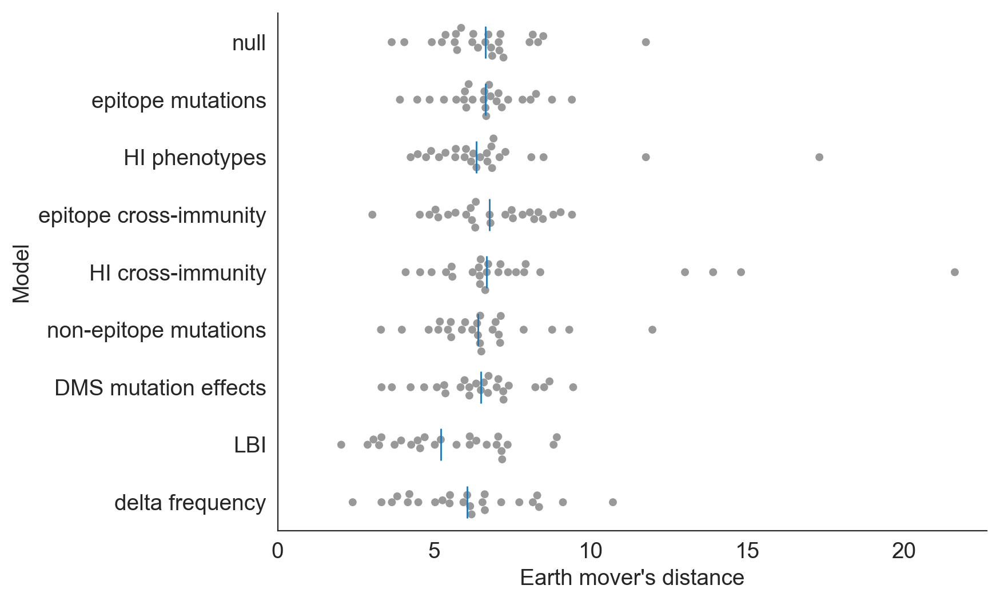

In [109]:
fig, ax = plt.subplots(1, 1, figsize=(8, 6))

ax.plot(
    individual_median_errors,
    predictor_type_order,
    marker="|",
    markersize=20,
    linestyle=""
)

ax = sns.swarmplot(
    x="validation_error",
    y="predictors",
    data=errors_by_time_df,
    ax=ax,
    order=predictor_type_order,
    color="#999999",
    zorder=-10
)

ax.set_yticklabels(predictor_names)

ax.set_xlabel("Earth mover's distance")
ax.set_ylabel("Model")
ax.set_xlim(left=0)

Text(0,0.5,'Model')

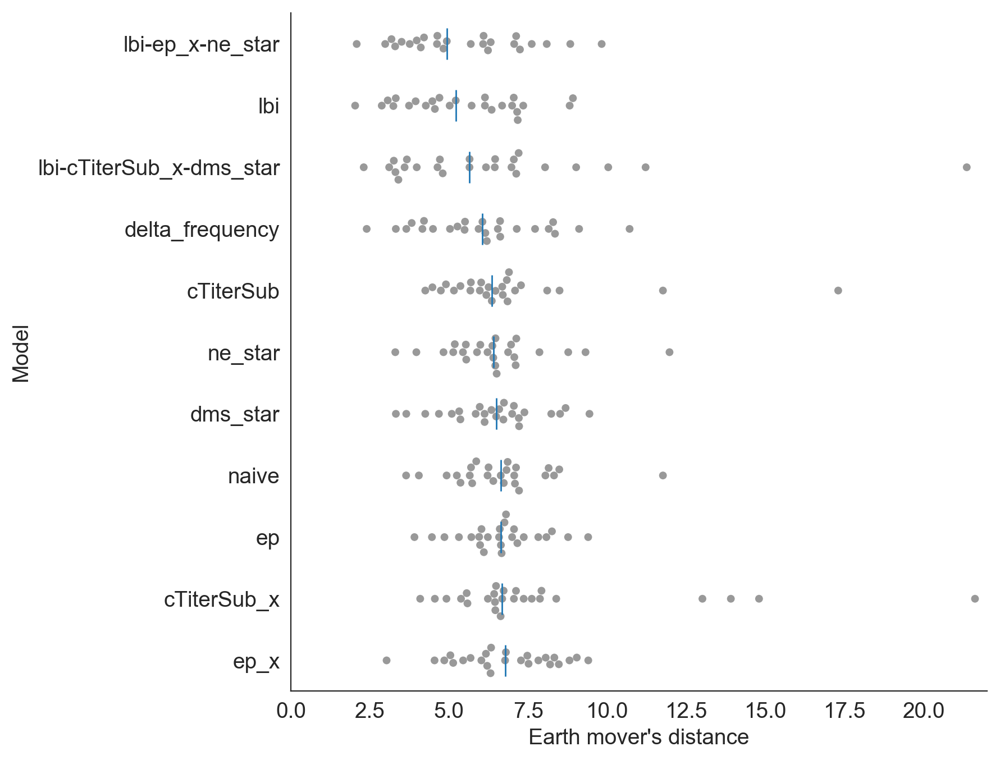

In [110]:
fig, ax = plt.subplots(1, 1, figsize=(8, 8))

ax.set_xlim(0, 22)

ax = sns.swarmplot(
    x="validation_error",
    y="predictors",
    data=errors_by_time_df,
    ax=ax,
    order=median_error_order,
    color="#999999",
    zorder=-10
)

ax.plot(
    median_error["validation_error"],
    median_error_order,
    marker="|",
    markersize=20,
    linestyle=""
)

ax.set_xlabel("Earth mover's distance")
ax.set_ylabel("Model")

In [111]:
errors_by_time_df.sort_values(by=["predictors", "validation_timepoint"], ascending=False).head()

,predictors,validation_error,validation_n,validation_timepoint,predictors_name
124,ne_star,6.466507,266,2014-10-01,non-epitope mutations
123,ne_star,6.958052,255,2014-04-01,non-epitope mutations
122,ne_star,5.130784,246,2013-10-01,non-epitope mutations
121,ne_star,5.437265,236,2013-04-01,non-epitope mutations
120,ne_star,7.102894,242,2012-10-01,non-epitope mutations


In [112]:
errors_by_time_df[errors_by_time_df["predictors"].str.contains("-")]["predictors"].unique()

array(['lbi-ep_x-ne_star', 'lbi-cTiterSub_x-dms_star'], dtype=object)

In [113]:
composite_predictors_order = [
    "lbi",
    "delta_frequency",
    "cTiterSub_x",
    "lbi-delta_frequency",
    "lbi-cTiterSub_x",
    "lbi-dms_star-cTiterSub_x",
    "lbi-ep_x-ne_star"
]

In [114]:
composite_predictor_names = [
    "LBI",
    "delta frequency",
    "HI cross.",
    "LBI, delta frequency",
    "LBI, HI cross.",
    "LBI, DMS, HI cross.",
    "Luksza and Lassig"
]

In [115]:
distance_df.head()

,predictors,sum,mean,median
0,lbi,134.814380,5.392575,5.209475
1,lbi-ep_x-ne_star,136.225152,5.449006,4.926944
2,delta_frequency,150.850078,6.034003,6.053008
3,lbi-cTiterSub_x-dms_star,159.071852,6.362874,5.646826
4,dms_star,159.243187,6.369727,6.487453


In [116]:
"lbi" in distance_df["predictors"].values

True

In [117]:
median_errors = []
for predictor in composite_predictors_order:
    if predictor in distance_df["predictors"].values:
        median_errors.append(distance_df.loc[distance_df["predictors"] == predictor, "median"].values[0])

In [118]:
composite_predictors_order = [
    "lbi",
    "delta_frequency",
    "cTiterSub_x",
    "lbi-delta_frequency",
    "lbi-cTiterSub_x",
    "lbi-dms_star-cTiterSub_x",
    "lbi-ep_x-ne_star"
]

composite_predictor_names = [
    "LBI",
    "delta frequency",
    "HI phenotypes",
    "LBI, delta frequency",
    "LBI, HI phenotypes",
    "LBI, DMS, HI phenotypes",
    "Luksza and Lassig"
]

In [119]:
median_errors

[5.209474563598633, 6.053008079528809, 6.6775078773498535, 4.926944255828857]

In [120]:
"""
if len(median_errors) > 0:
    fig, ax = plt.subplots(1, 1, figsize=(8, 4))

    ax.set_xlim(0, 22)
    ax = sns.swarmplot(
        x="validation_error",
        y="predictors",
        data=errors_by_time_df,
        ax=ax,
        color="#999999",
        order=composite_predictors_order
    )

    ax.plot(
        median_errors,
        composite_predictors_order,
        marker="|",
        markersize=20,
        linestyle="",
        zorder=10
    )

    ax.set_yticklabels(composite_predictor_names)

    #labels = ax.get_yticklabels()
    #output = plt.setp(labels, rotation=30)

    ax.set_xlabel("Earth mover's distance")
    ax.set_ylabel("Model")
    ax.axvline(x=0.0, color="#cccccc", zorder=-20, alpha=0.25)

    plt.tight_layout()
"""

'\nif len(median_errors) > 0:\n    fig, ax = plt.subplots(1, 1, figsize=(8, 4))\n\n    ax.set_xlim(0, 22)\n    ax = sns.swarmplot(\n        x="validation_error",\n        y="predictors",\n        data=errors_by_time_df,\n        ax=ax,\n        color="#999999",\n        order=composite_predictors_order\n    )\n\n    ax.plot(\n        median_errors,\n        composite_predictors_order,\n        marker="|",\n        markersize=20,\n        linestyle="",\n        zorder=10\n    )\n\n    ax.set_yticklabels(composite_predictor_names)\n\n    #labels = ax.get_yticklabels()\n    #output = plt.setp(labels, rotation=30)\n\n    ax.set_xlabel("Earth mover\'s distance")\n    ax.set_ylabel("Model")\n    ax.axvline(x=0.0, color="#cccccc", zorder=-20, alpha=0.25)\n\n    plt.tight_layout()\n'

In [121]:
errors_by_time_df.loc[pd.isnull(errors_by_time_df["predictors_name"]), "predictors_name"] = errors_by_time_df.loc[
    pd.isnull(errors_by_time_df["predictors_name"]), "predictors"
]

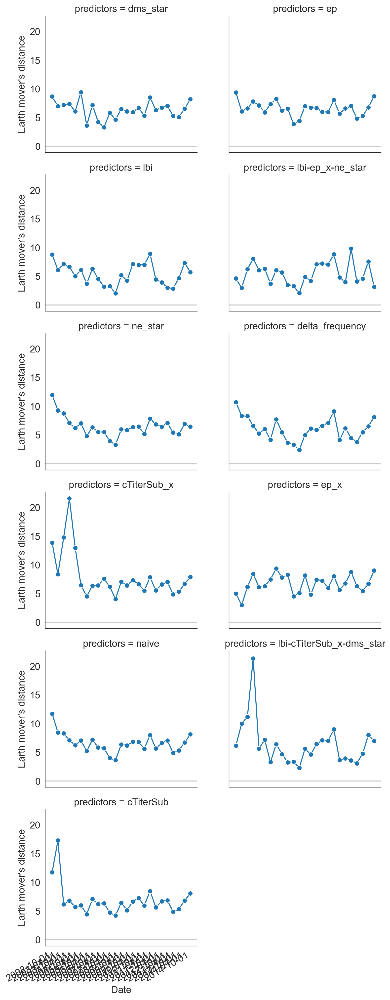

In [122]:
g = facet_time_plot(
    errors_by_time_df,
    "validation_error",
    "Earth mover's distance",
    timepoint_column="validation_timepoint",
    col_wrap=2,
    markersize=7
)

In [123]:
predictor_type_order

['naive',
 'ep',
 'cTiterSub',
 'ep_x',
 'cTiterSub_x',
 'ne_star',
 'dms_star',
 'lbi',
 'delta_frequency']

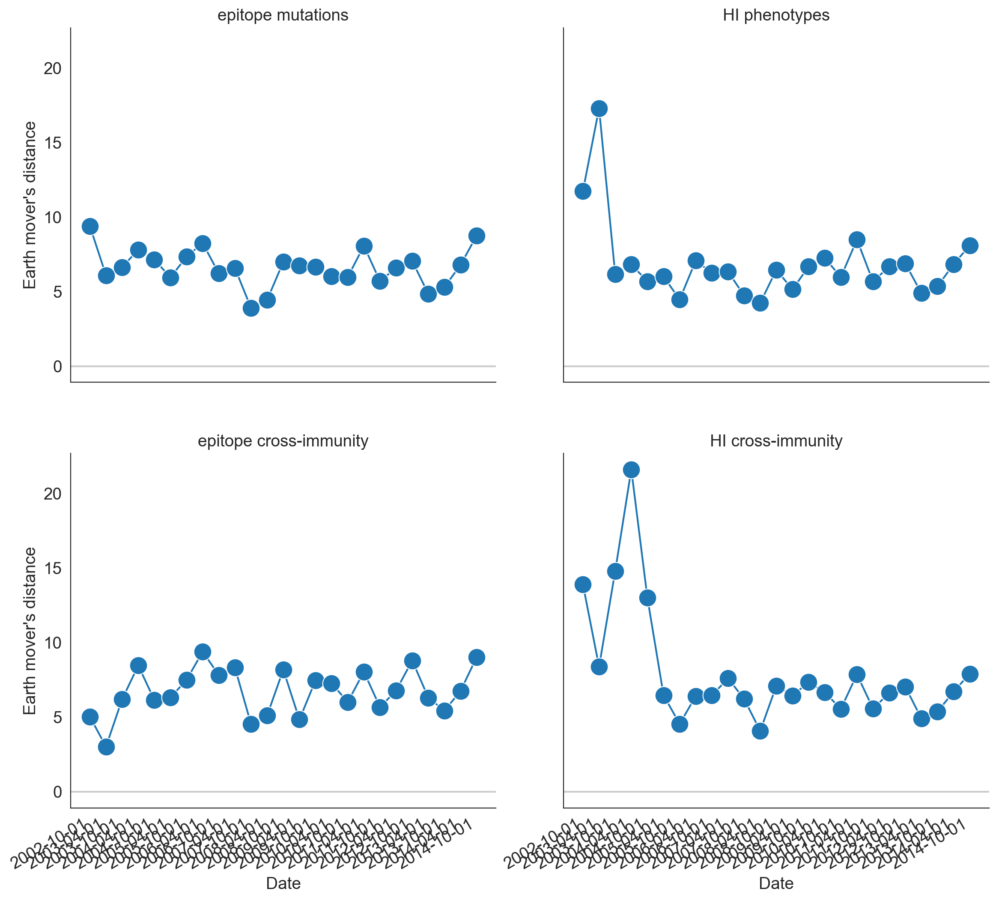

In [124]:
antigenic_predictors = predictor_type_order[1:5]
g = facet_time_plot(
    errors_by_time_df[errors_by_time_df["predictors"].isin(antigenic_predictors)],
    "validation_error",
    "Earth mover's distance",
    timepoint_column="validation_timepoint",
    predictors_column="predictors_name",
    col_wrap=2,
    height=6,
    aspect=1.,
    col_order=[predictor_name_by_id[predictor] for predictor in antigenic_predictors]
)
g.set_titles("{col_name}")
g.fig.subplots_adjust(hspace=0.2)

In [125]:
predictor_type_order

['naive',
 'ep',
 'cTiterSub',
 'ep_x',
 'cTiterSub_x',
 'ne_star',
 'dms_star',
 'lbi',
 'delta_frequency']

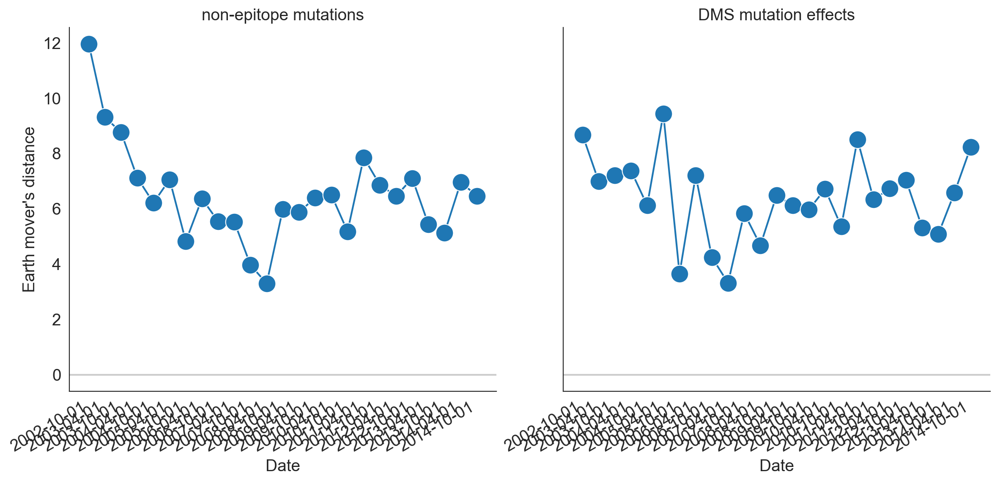

In [126]:
functional_predictors = predictor_type_order[5:7]
g = facet_time_plot(
    errors_by_time_df[errors_by_time_df["predictors"].isin(functional_predictors)],
    "validation_error",
    "Earth mover's distance",
    timepoint_column="validation_timepoint",
    predictors_column="predictors_name",
    col_wrap=2,
    height=6,
    aspect=1.,
    col_order=[predictor_name_by_id[predictor] for predictor in functional_predictors]
)
g.set_titles("{col_name}")
g.fig.subplots_adjust(hspace=0.2)


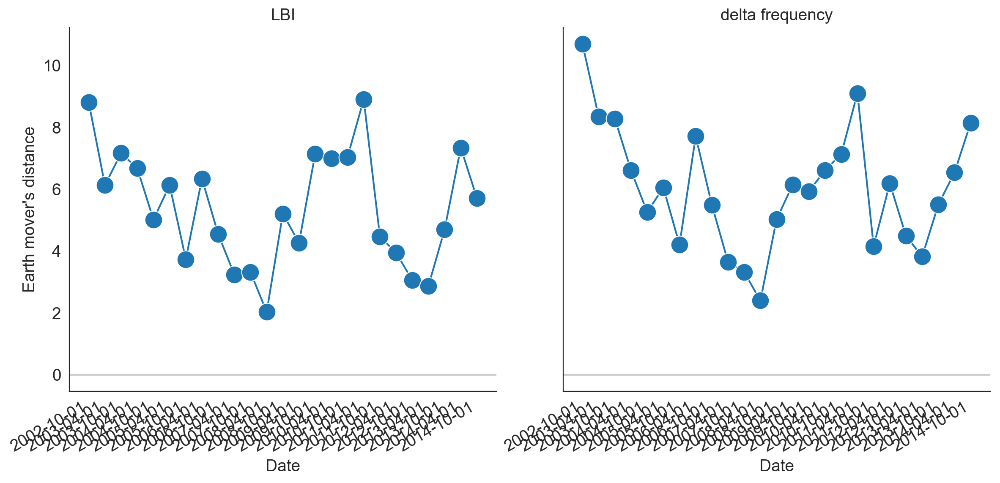

In [127]:
growth_predictors = predictor_type_order[7:]
g = facet_time_plot(
    errors_by_time_df[errors_by_time_df["predictors"].isin(growth_predictors)],
    "validation_error",
    "Earth mover's distance",
    timepoint_column="validation_timepoint",
    predictors_column="predictors_name",
    col_wrap=2,
    height=6,
    aspect=1.,
    col_order=[predictor_name_by_id[predictor] for predictor in growth_predictors]
)
g.set_titles("{col_name}")
g.fig.subplots_adjust(hspace=0.2)

In [128]:
errors_by_time_df["predictors"].unique()

array(['dms_star', 'ep', 'lbi', 'lbi-ep_x-ne_star', 'ne_star',
       'delta_frequency', 'cTiterSub_x', 'ep_x', 'naive',
       'lbi-cTiterSub_x-dms_star', 'cTiterSub'], dtype=object)

In [129]:
errors_by_time_df[errors_by_time_df["predictors"] == "naive"]

,predictors,validation_error,validation_n,validation_timepoint,predictors_name
200,naive,11.756854,110,2002-10-01,null
201,naive,8.481310,117,2003-04-01,null
202,naive,8.315088,140,2003-10-01,null
203,naive,7.114256,157,2004-04-01,null
204,naive,6.246755,152,2004-10-01,null
205,naive,7.081207,165,2005-04-01,null
206,naive,5.244347,181,2005-10-01,null
207,naive,7.209756,188,2006-04-01,null
208,naive,5.857956,161,2006-10-01,null
209,naive,5.729685,165,2007-04-01,null


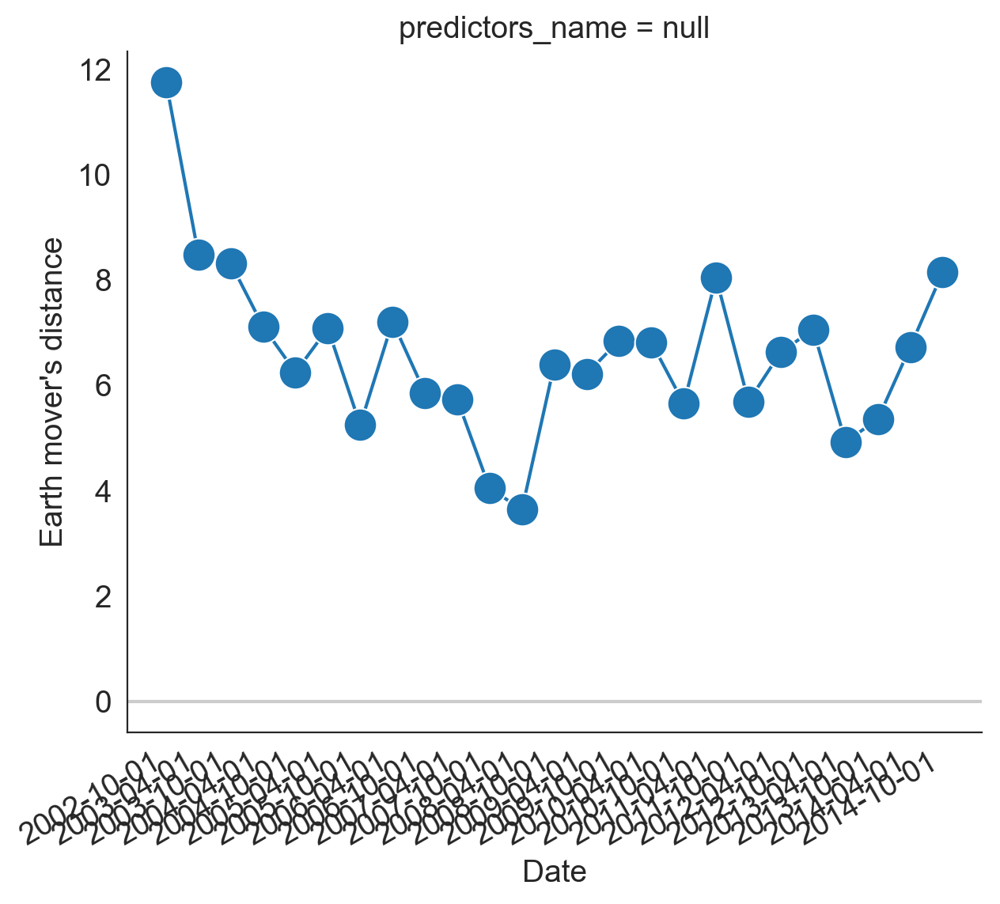

In [130]:
g = facet_time_plot(
    errors_by_time_df[errors_by_time_df["predictors"] == "naive"],
    "validation_error",
    "Earth mover's distance",
    timepoint_column="validation_timepoint",
    predictors_column="predictors_name",
    height=6,
    aspect=1
)
#g.set_titles("{col_name}")
#g.fig.subplots_adjust(hspace=0.2)

In [131]:
errors_by_time_df.head()

,predictors,validation_error,validation_n,validation_timepoint,predictors_name
0,dms_star,8.680402,110,2002-10-01,DMS mutation effects
1,dms_star,6.992349,117,2003-04-01,DMS mutation effects
2,dms_star,7.211693,140,2003-10-01,DMS mutation effects
3,dms_star,7.379968,157,2004-04-01,DMS mutation effects
4,dms_star,6.121948,152,2004-10-01,DMS mutation effects


### Adjusted earth mover's distance (relative to naive model)

In [132]:
naive_error = errors_by_time_df[errors_by_time_df["predictors"] == "naive"]["validation_error"].values
for predictor in errors_by_time_df["predictors"].drop_duplicates().values:
    errors_by_time_df.loc[errors_by_time_df["predictors"] == predictor, "adjusted_error"] = errors_by_time_df.loc[errors_by_time_df["predictors"] == predictor, "validation_error"] - naive_error

In [133]:
naive_error

array([11.75685406,  8.48130989,  8.31508827,  7.11425591,  6.24675465,
        7.0812068 ,  5.24434662,  7.20975637,  5.85795593,  5.72968483,
        4.0446949 ,  3.64135385,  6.39666939,  6.2152462 ,  6.85015917,
        6.81495333,  5.65303373,  8.04225922,  5.69275427,  6.63114595,
        7.05769348,  4.92183685,  5.35997677,  6.7279892 ,  8.14496899])

In [134]:
median_adjusted_error = errors_by_time_df.groupby("predictors")["adjusted_error"].median().reset_index().sort_values(by="adjusted_error")
median_adjusted_error_order = median_adjusted_error["predictors"].values

In [135]:
errors_by_time_df["adjusted_error"].min()

-7.1282639503479

In [136]:
errors_by_time_df["adjusted_error"].max()

14.503290176391602

In [137]:
median_adjusted_error_order

array(['lbi', 'lbi-ep_x-ne_star', 'lbi-cTiterSub_x-dms_star',
       'delta_frequency', 'ne_star', 'dms_star', 'cTiterSub_x',
       'cTiterSub', 'naive', 'ep', 'ep_x'], dtype=object)

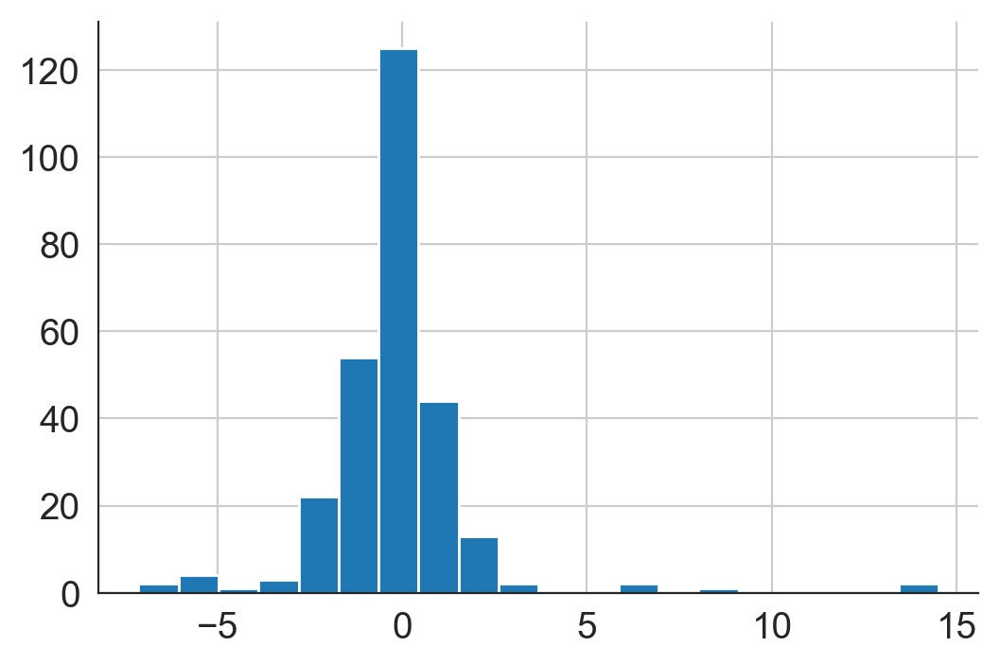

In [138]:
errors_by_time_df["adjusted_error"].hist(bins=20)

Text(0,0.5,'Model')

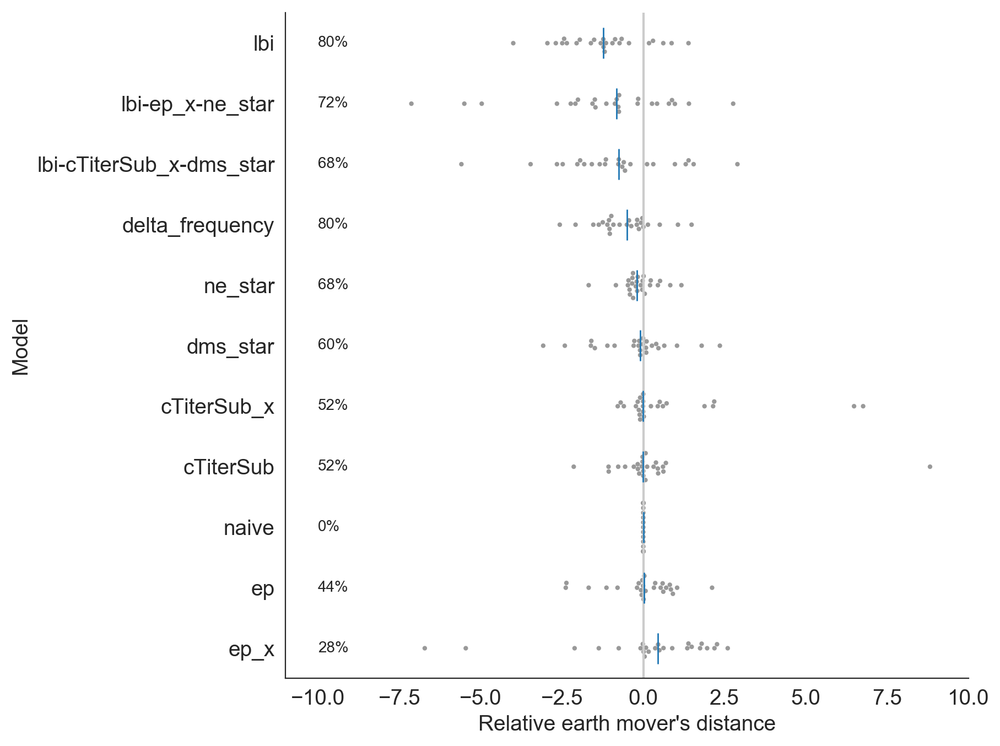

In [139]:
fig, ax = plt.subplots(1, 1, figsize=(8, 8))

ax.set_xlim(-11, 10)

ax = sns.swarmplot(
    x="adjusted_error",
    y="predictors",
    data=errors_by_time_df,
    ax=ax,
    order=median_adjusted_error_order,
    color="#999999",
    zorder=-10,
    size=3
)

ax.plot(
    median_adjusted_error["adjusted_error"],
    median_adjusted_error_order,
    marker="|",
    markersize=20,
    linestyle=""
)


#ax.text(0.5, 0, "test")
for i, predictor in enumerate(median_adjusted_error_order):
    predictor_errors = errors_by_time_df.loc[errors_by_time_df["predictors"] == predictor, "adjusted_error"]
    
    ax.text(
        -10,
        i,
        "%i%%" % (((predictor_errors < 0).sum() / float(predictor_errors.shape[0])) * 100),
        horizontalalignment='left',
        verticalalignment='center',
        fontsize=10
    )

ax.axvline(x=0, color="#cccccc", zorder=-10)

ax.set_xlabel("Relative earth mover's distance")
ax.set_ylabel("Model")

In [140]:
errors_by_time_df.head()

,predictors,validation_error,validation_n,validation_timepoint,predictors_name,adjusted_error
0,dms_star,8.680402,110,2002-10-01,DMS mutation effects,-3.076452
1,dms_star,6.992349,117,2003-04-01,DMS mutation effects,-1.488961
2,dms_star,7.211693,140,2003-10-01,DMS mutation effects,-1.103395
3,dms_star,7.379968,157,2004-04-01,DMS mutation effects,0.265712
4,dms_star,6.121948,152,2004-10-01,DMS mutation effects,-0.124807


In [141]:
coefficients_by_time_df.head()

,coefficient,predictor,predictors,validation_timepoint
0,0.713870,dms_star,dms_star,2002-10-01
1,0.731358,dms_star,dms_star,2003-04-01
2,1.141822,dms_star,dms_star,2003-10-01
3,1.680347,dms_star,dms_star,2004-04-01
4,1.636966,dms_star,dms_star,2004-10-01


In [142]:
errors_and_coefficients_by_time = coefficients_by_time_df.merge(
    errors_by_time_df,
    on=["predictors", "validation_timepoint"]
)

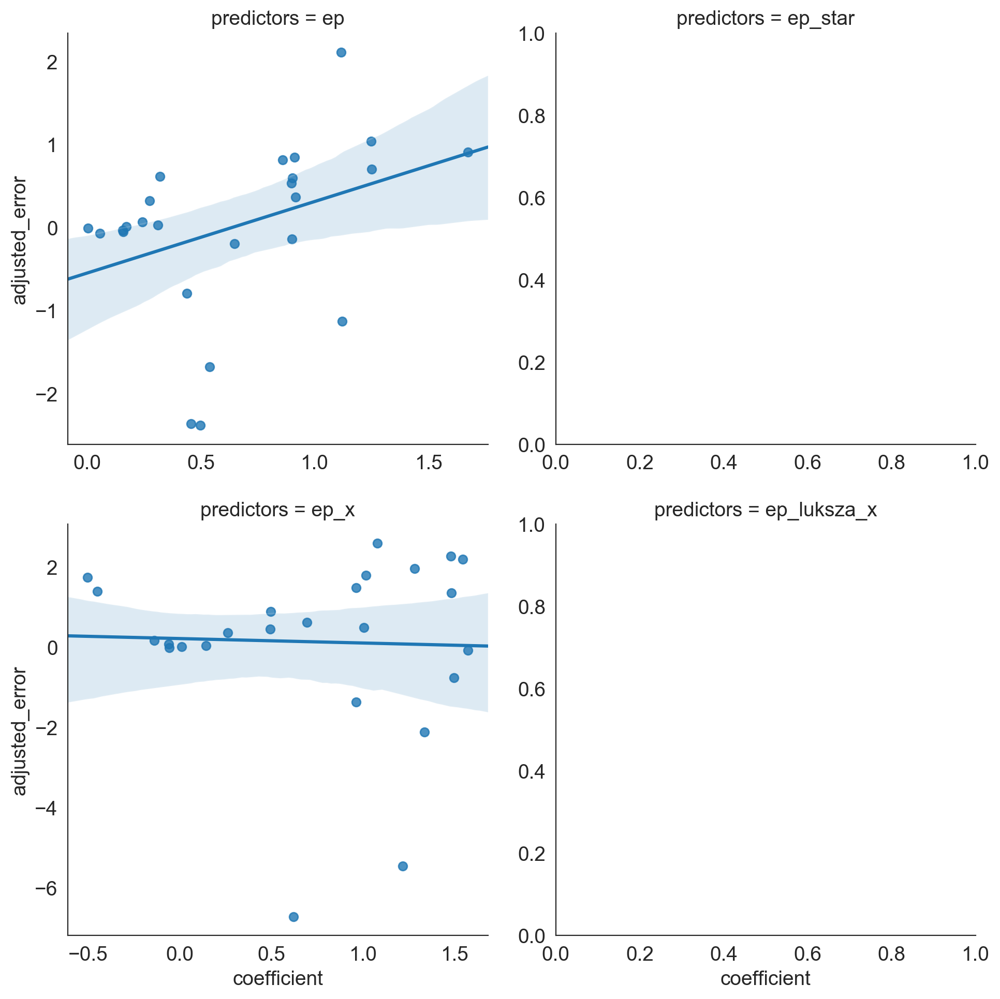

In [143]:
sns.lmplot(
    "coefficient",
    "adjusted_error",
    errors_and_coefficients_by_time,
    col="predictors",
    col_wrap=2,
    sharex=False,
    sharey=False,
    col_order=["ep", "ep_star", "ep_x", "ep_luksza_x"]
)

In [144]:
predictor_errors.shape[0]

25

Text(0,0.5,'Model')

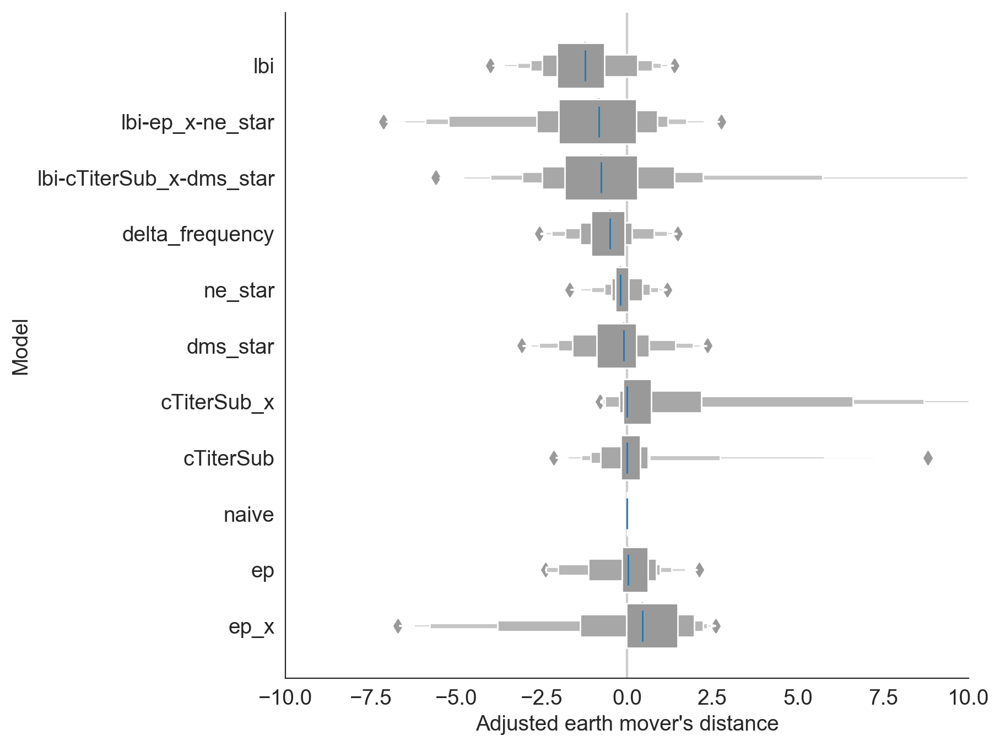

In [145]:
fig, ax = plt.subplots(1, 1, figsize=(8, 8))

ax.set_xlim(-10, 10)

"""
ax = sns.swarmplot(
    x="adjusted_error",
    y="predictors",
    data=errors_by_time_df,
    ax=ax,
    order=median_adjusted_error_order,
    color="#999999",
    zorder=-10
)
"""

ax = sns.boxenplot(
    x="adjusted_error",
    y="predictors",
    data=errors_by_time_df,
    ax=ax,
    order=median_adjusted_error_order,
    color="#999999",
    zorder=-10
)

ax.plot(
    median_adjusted_error["adjusted_error"],
    median_adjusted_error_order,
    marker="|",
    markersize=20,
    linestyle=""
)

ax.axvline(x=0, color="#cccccc", zorder=-10)

ax.set_xlabel("Adjusted earth mover's distance")
ax.set_ylabel("Model")

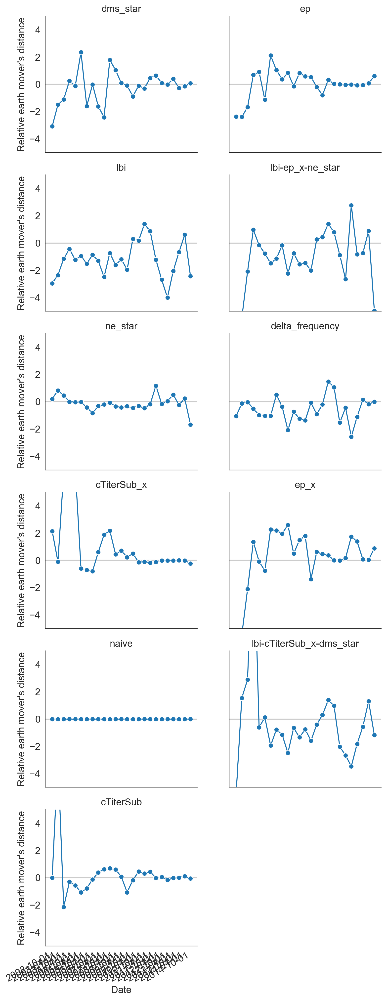

In [146]:
g = facet_time_plot(errors_by_time_df, "adjusted_error", "Relative earth mover's distance", timepoint_column="validation_timepoint",
                    col_wrap=2, markersize=7)
g.set_titles("{col_name}")

for ax in g.axes.flatten():
    ax.set_ylim(-5, 5)

In [147]:
individual_predictor_names_order

['ep_x', 'cTiterSub_x', 'ne_star', 'dms_star', 'lbi', 'delta_frequency']

In [148]:
errors_by_time_df.head()

,predictors,validation_error,validation_n,validation_timepoint,predictors_name,adjusted_error
0,dms_star,8.680402,110,2002-10-01,DMS mutation effects,-3.076452
1,dms_star,6.992349,117,2003-04-01,DMS mutation effects,-1.488961
2,dms_star,7.211693,140,2003-10-01,DMS mutation effects,-1.103395
3,dms_star,7.379968,157,2004-04-01,DMS mutation effects,0.265712
4,dms_star,6.121948,152,2004-10-01,DMS mutation effects,-0.124807


In [149]:
errors_by_time_df["validation_timepoint_float"] = mdates.date2num(pd.to_datetime(errors_by_time_df["validation_timepoint"]))

In [150]:
def facet_time_plot_with_labels(data, value, value_label, timepoint_column="timepoint", predictors_column="predictors", hue=None,
                    height=4, aspect=1, col_order=None, col_wrap=4, markersize=15, grid_kwargs=None):
    if grid_kwargs is None:
        grid_kwargs = {}
        
    g = sns.FacetGrid(data, col=predictors_column, col_order=col_order, col_wrap=col_wrap, hue=hue,
                      height=height, aspect=aspect, **grid_kwargs)
    g.map_dataframe(sns.lineplot, x=timepoint_column, y=value, estimator="mean", ci="sd", markers=True, dashes=False,
                   style=predictors_column, markersize=markersize)
    g.set_axis_labels("Date", value_label)

    for ax in g.axes.flatten():
        ax.axhline(y=0, color="#cccccc", zorder=-10)

        ax.xaxis.set_major_locator(mdates.YearLocator())
        #ax.xaxis.set_minor_locator(mdates.MonthLocator())
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

        #ax.fmt_xdata = mdates.DateFormatter('%Y')
        
        #start, end = [int(value) for value in ax.get_xlim()]
        #end = end + 1
        #stepsize = 2.0
        #ax.xaxis.set_ticks(np.arange(start, end, stepsize))

        #labels = ax.get_xticklabels()
        #output = plt.setp(labels, rotation=30)
        
    plt.gcf().autofmt_xdate(rotation=45)
    return g

In [151]:
mpl.__version__

'2.2.4'

In [152]:
best_models = [
    "ep_x",
    "ne_star",
    "lbi",
    "lbi-ep_x-ne_star",
    "cTiterSub_x",
    "dms_star",
    "delta_frequency",
    "lbi-cTiterSub_x-dms_star"
]

best_predictor_names = [
    "epitope mutations",
    "non-epitope mutations",
    "LBI",
    "LBI and mutations",
    "HI phenotypes",
    "DMS phenotypes",
    "delta frequency",
    "LBI, HI, and DMS"
]

In [153]:
final_models_by_time_df = errors_by_time_df[errors_by_time_df["predictors"].isin(best_models)].copy()

In [154]:
final_models_by_time_df["predictors_name"] = final_models_by_time_df["predictors"].map(dict(zip(best_models, best_predictor_names)))

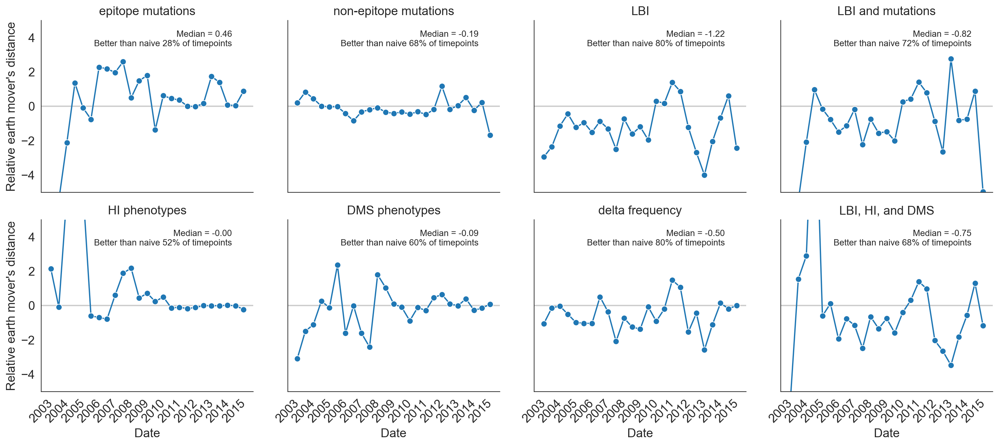

In [155]:
g = facet_time_plot_with_labels(
    final_models_by_time_df,
    "adjusted_error",
    "Relative earth mover's distance",
    predictors_column="predictors_name",
    timepoint_column="validation_timepoint_float",
    col_wrap=4,
    markersize=7,
    col_order=best_predictor_names
)
g.set_titles("{col_name}")

for ((i, j, k), facet_df), ax in zip(g.facet_data(), g.axes.flat):
    ax.set_ylim(-5, 5)
    
    proportion_better_than_naive = int(round(sum(facet_df["adjusted_error"] < 0) / float(facet_df.shape[0]) * 100))
    ax.text(
        0.9,
        0.85,
        "Median = %.2f\nBetter than naive %i%% of timepoints" % (facet_df["adjusted_error"].median(), proportion_better_than_naive),
        transform=ax.transAxes,
        fontsize=10,
        horizontalalignment='right'
    )

## Summarize model coefficients

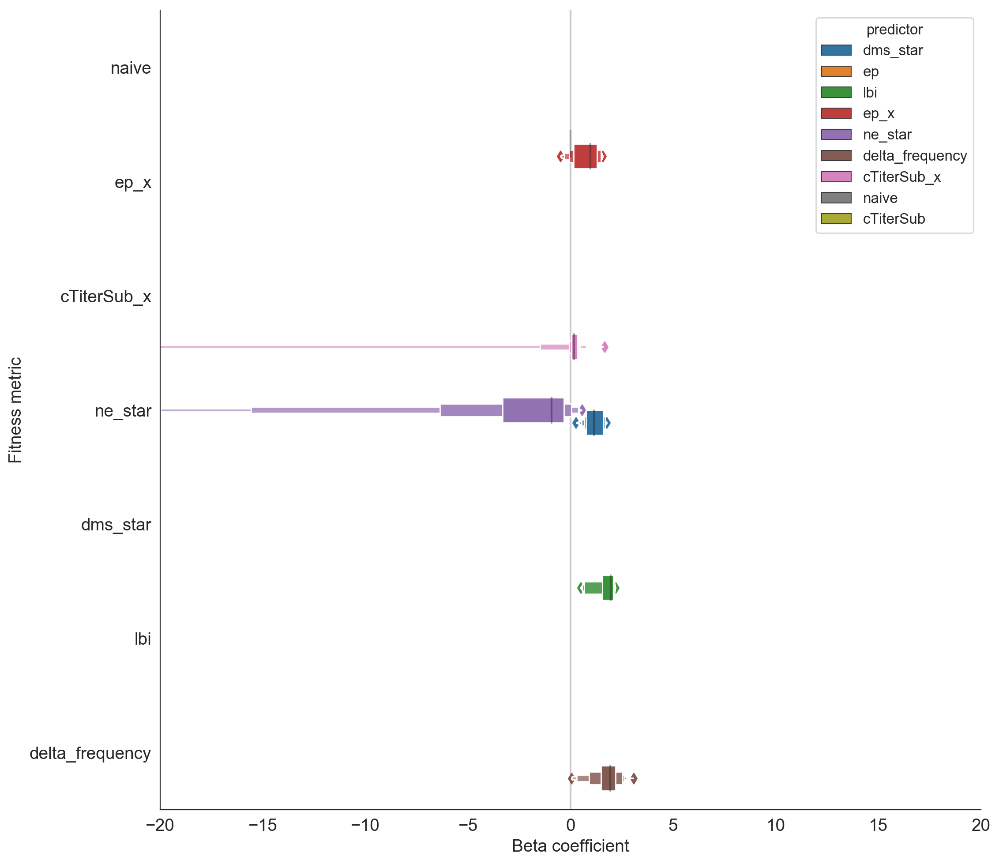

In [156]:
fig, ax = plt.subplots(1, 1, figsize=(12, 12))

ax.set_xlim(-20, 20)
sns.boxenplot(
    y="predictors",
    x="coefficient",
    hue="predictor",
    data=coefficients_by_time_df,
    width=2.0,
    ax=ax,
    order=predictor_names_order
)

ax.axvline(0, color="#999999", alpha=0.5, zorder=-10)
ax.set_xlabel("Beta coefficient")
ax.set_ylabel("Fitness metric")

sns.despine()

In [157]:
overall_coefficients_df

,mean,predictor,predictors,std
0,1.147005,dms_star,dms_star,0.458105
1,0.642638,ep,ep,0.433509
2,1.676325,lbi,lbi,0.561060
3,1.488946,lbi,lbi-ep_x-ne_star,0.956605
4,0.217081,ep_x,lbi-ep_x-ne_star,0.815760
5,-1.484696,ne_star,lbi-ep_x-ne_star,2.184365
6,-3.251038,ne_star,ne_star,5.880190
7,1.773099,delta_frequency,delta_frequency,0.740787
8,-2.921208,cTiterSub_x,cTiterSub_x,14.966007
9,0.716939,ep_x,ep_x,0.647291


In [158]:
coefficients_by_time_df.head()

,coefficient,predictor,predictors,validation_timepoint
0,0.713870,dms_star,dms_star,2002-10-01
1,0.731358,dms_star,dms_star,2003-04-01
2,1.141822,dms_star,dms_star,2003-10-01
3,1.680347,dms_star,dms_star,2004-04-01
4,1.636966,dms_star,dms_star,2004-10-01


In [159]:
final_coefficients_by_time = coefficients_by_time_df[coefficients_by_time_df["predictors"].isin(best_models)].copy()

In [160]:
final_coefficients_by_time["predictors_name"] = final_coefficients_by_time["predictors"].map(dict(zip(best_models, best_predictor_names)))

In [161]:
final_coefficients_by_time["validation_timepoint_float"] = mdates.date2num(pd.to_datetime(final_coefficients_by_time["validation_timepoint"]))

In [162]:
final_coefficients_by_time.head()

,coefficient,predictor,predictors,validation_timepoint,predictors_name,validation_timepoint_float
0,0.713870,dms_star,dms_star,2002-10-01,DMS phenotypes,731124.0
1,0.731358,dms_star,dms_star,2003-04-01,DMS phenotypes,731306.0
2,1.141822,dms_star,dms_star,2003-10-01,DMS phenotypes,731489.0
3,1.680347,dms_star,dms_star,2004-04-01,DMS phenotypes,731672.0
4,1.636966,dms_star,dms_star,2004-10-01,DMS phenotypes,731855.0


In [163]:
coefficients_by_time_df["predictors_name"] = coefficients_by_time_df["predictors"].map(predictor_name_by_id)

In [164]:
coefficients_by_time_df.loc[pd.isnull(coefficients_by_time_df["predictors_name"]), "predictors_name"] = coefficients_by_time_df.loc[
    pd.isnull(coefficients_by_time_df["predictors_name"]), "predictors"
]

In [165]:
coefficients_by_time_df["predictors_name"].unique().shape

(11,)

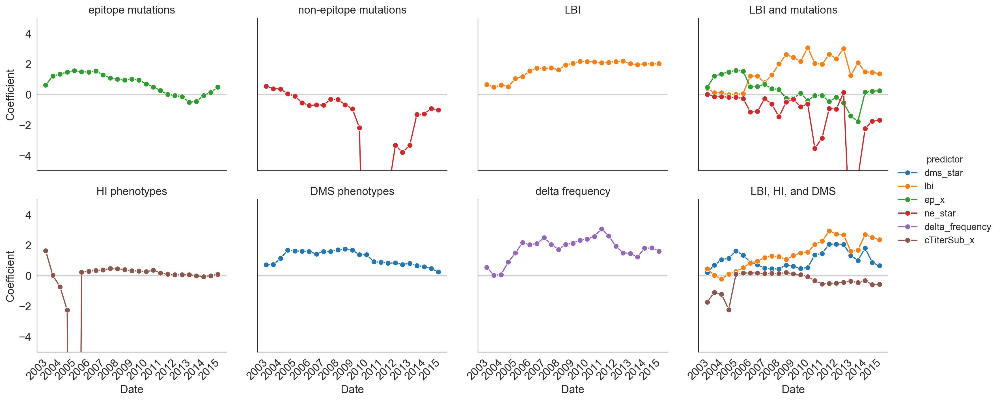

In [166]:
g = facet_time_plot_with_labels(
    final_coefficients_by_time,
    "coefficient",
    "Coefficient",
    timepoint_column="validation_timepoint_float",
    predictors_column="predictors_name",
    hue="predictor",
    col_order=best_predictor_names,
    col_wrap=4,
    markersize=7
)
g.set_titles("{col_name}")
g.add_legend()

for ((i, j, k), facet_df), ax in zip(g.facet_data(), g.axes.flat):
    ax.set_ylim(-5, 5)

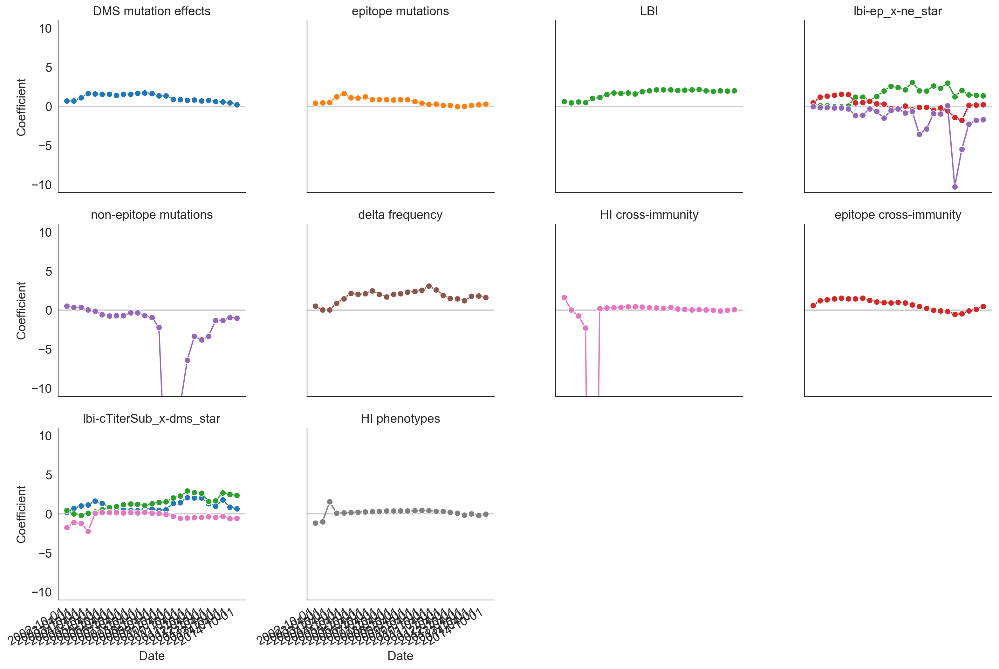

In [167]:
g = facet_time_plot(
    coefficients_by_time_df[coefficients_by_time_df["predictors"] != "naive"],
    "coefficient",
    "Coefficient",
    timepoint_column="validation_timepoint",
    predictors_column="predictors_name",
    hue="predictor",
    markersize=7
)
g.set_titles("{col_name}")

for ax in g.axes.flatten():
    ax.set_ylim(-11, 11)

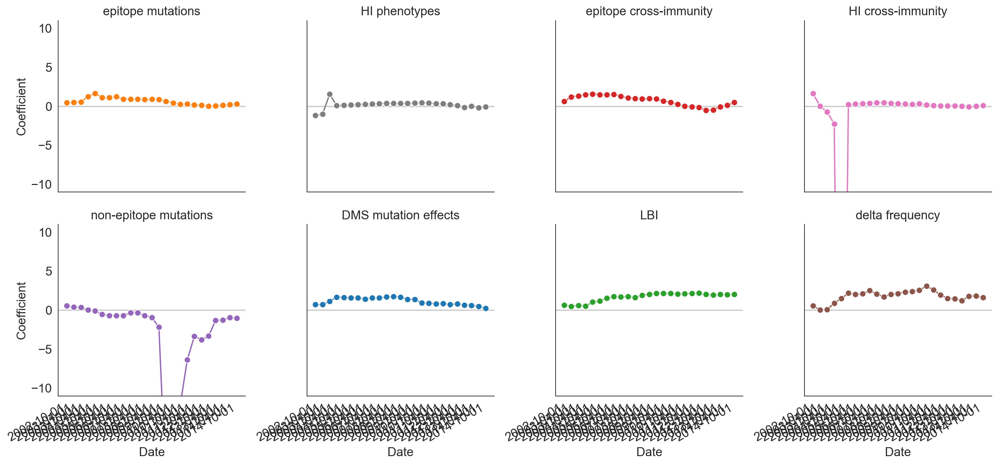

In [168]:
g = facet_time_plot(
    coefficients_by_time_df[coefficients_by_time_df["predictors"] != "naive"],
    "coefficient",
    "Coefficient",
    timepoint_column="validation_timepoint",
    predictors_column="predictors_name",
    col_order=[predictor_name_by_id[predictor] for predictor in predictor_type_order[1:]],
    hue="predictor",
    markersize=7
)
g.set_titles("{col_name}")

for ax in g.axes.flatten():
    ax.set_ylim(-11, 11)

In [169]:
print(coefficients_by_time_df.loc[coefficients_by_time_df["predictors"] == "lbi", ["validation_timepoint", "coefficient"]])

   validation_timepoint  coefficient
50           2002-10-01     0.661874
51           2003-04-01     0.485866
52           2003-10-01     0.619262
53           2004-04-01     0.517824
54           2004-10-01     1.045853
55           2005-04-01     1.183944
56           2005-10-01     1.549800
57           2006-04-01     1.737661
58           2006-10-01     1.712242
59           2007-04-01     1.745121
60           2007-10-01     1.623640
61           2008-04-01     1.931390
62           2008-10-01     2.050398
63           2009-04-01     2.170720
64           2009-10-01     2.163121
65           2010-04-01     2.140621
66           2010-10-01     2.082488
67           2011-04-01     2.107983
68           2011-10-01     2.159638
69           2012-04-01     2.188541
70           2012-10-01     2.020289
71           2013-04-01     1.960755
72           2013-10-01     2.015940
73           2014-04-01     2.009556
74           2014-10-01     2.023599


In [170]:
print(coefficients_by_time_df.loc[coefficients_by_time_df["predictors"] == "ne_star", ["validation_timepoint", "coefficient"]])

    validation_timepoint  coefficient
150           2002-10-01     0.553999
151           2003-04-01     0.385939
152           2003-10-01     0.369224
153           2004-04-01     0.043629
154           2004-10-01    -0.101661
155           2005-04-01    -0.541213
156           2005-10-01    -0.710143
157           2006-04-01    -0.681988
158           2006-10-01    -0.685601
159           2007-04-01    -0.309663
160           2007-10-01    -0.324844
161           2008-04-01    -0.675855
162           2008-10-01    -0.925912
163           2009-04-01    -2.182286
164           2009-10-01   -23.003322
165           2010-04-01   -18.974553
166           2010-10-01   -12.187566
167           2011-04-01    -6.373747
168           2011-10-01    -3.331039
169           2012-04-01    -3.790576
170           2012-10-01    -3.321122
171           2013-04-01    -1.304337
172           2013-10-01    -1.275721
173           2014-04-01    -0.919497
174           2014-10-01    -1.008104


In [171]:
composite_predictors_order

['lbi',
 'delta_frequency',
 'cTiterSub_x',
 'lbi-delta_frequency',
 'lbi-cTiterSub_x',
 'lbi-dms_star-cTiterSub_x',
 'lbi-ep_x-ne_star']

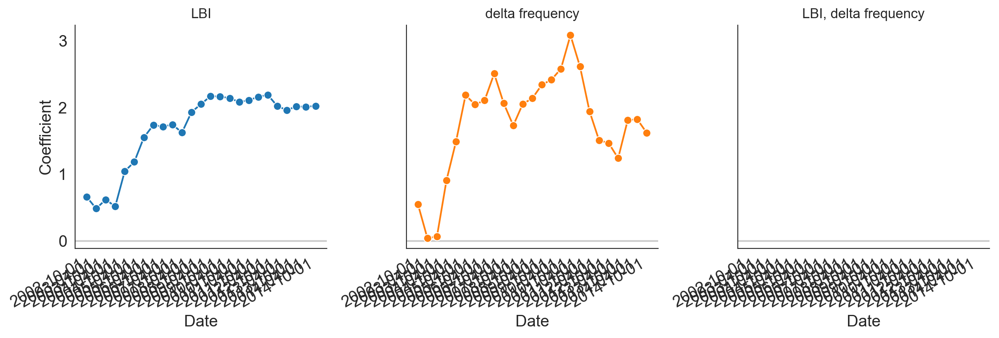

In [172]:
lbi_dfreq_order = ["lbi", "delta_frequency", "lbi-delta_frequency"]
lbi_dfreq_names = ["LBI", "delta frequency", "LBI, delta frequency"]
g = facet_time_plot(
    coefficients_by_time_df[coefficients_by_time_df["predictors"].isin(lbi_dfreq_order)],
    "coefficient",
    "Coefficient",
    timepoint_column="validation_timepoint",
    hue="predictor",
    col_order=lbi_dfreq_order,
    markersize=7
)

#g.set_titles("{col_name}")

for ci, ax in enumerate(g.axes.flatten()):
    ax.set_title(lbi_dfreq_names[ci], fontsize=12)
    #ax.set_ylim(-2., 2.)

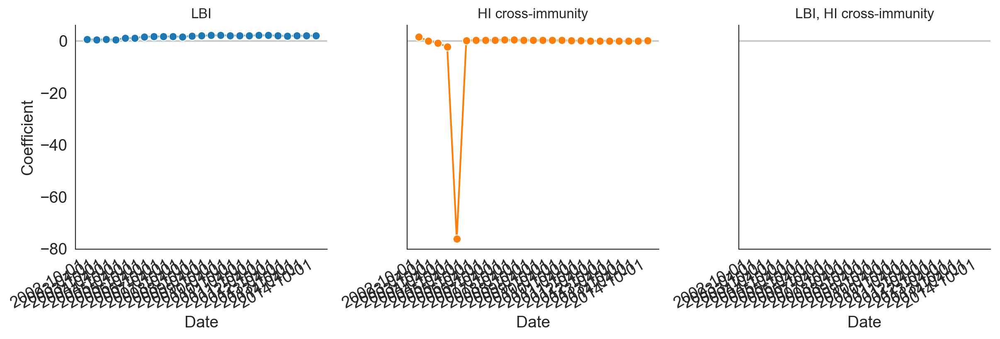

In [173]:
lbi_dfreq_order = ["lbi", "cTiterSub_x", "lbi-cTiterSub_x"]
lbi_dfreq_names = ["LBI", "HI cross-immunity", "LBI, HI cross-immunity"]
g = facet_time_plot(
    coefficients_by_time_df[coefficients_by_time_df["predictors"].isin(lbi_dfreq_order)],
    "coefficient",
    "Coefficient",
    timepoint_column="validation_timepoint",
    hue="predictor",
    col_order=lbi_dfreq_order,
    markersize=7
)

#g.set_titles("{col_name}")

for ci, ax in enumerate(g.axes.flatten()):
    ax.set_title(lbi_dfreq_names[ci], fontsize=12)
    #ax.set_ylim(-2., 2.)